<div class="alert alert-block alert-info">
<center> <h1> Business Cases with Data Science MDSAA-BA </h1> </center> <br>
<center> Business Case 1 - 2020/2021 </center>

**GROUP Z:** <br>
- Ana Paulino (20170743) <br>
- Carolina Pina (20170790) <br>
- Soraia Cunha (20170806)

## Data Understanding

### Collect initial data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
import phik
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
import matplotlib.cm as cm
from sklearn.metrics import davies_bouldin_score
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

In [2]:
df=pd.DataFrame(pd.read_excel("WonderfulWinesoftheWorld.xlsx"))

In [3]:
df=df.drop(columns={"Rand"})

### Describe, explore and assess data quality

In [4]:
df.drop(df.tail(1).index,inplace=True)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Custid       10000 non-null  float64
 1   Dayswus      10000 non-null  float64
 2   Age          10000 non-null  float64
 3   Edu          10000 non-null  float64
 4   Income       10000 non-null  float64
 5   Kidhome      10000 non-null  float64
 6   Teenhome     10000 non-null  float64
 7   Freq         10000 non-null  float64
 8   Recency      10000 non-null  float64
 9   Monetary     10000 non-null  float64
 10  LTV          10000 non-null  float64
 11  Perdeal      10000 non-null  float64
 12  Dryred       10000 non-null  float64
 13  Sweetred     10000 non-null  float64
 14  Drywh        10000 non-null  float64
 15  Sweetwh      10000 non-null  float64
 16  Dessert      10000 non-null  float64
 17  Exotic       10000 non-null  float64
 18  WebPurchase  10000 non-null  float64
 19  WebVi

In [6]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Custid,10000.0,6000.5000,2886.895680,1001.0,3500.75,6000.5,8500.25,11000.0
Dayswus,10000.0,898.1020,202.492789,550.0,723.75,894.0,1074.00,1250.0
Age,10000.0,47.9273,17.302721,18.0,33.00,48.0,63.00,78.0
Edu,10000.0,16.7391,1.876375,12.0,15.00,17.0,18.00,20.0
Income,10000.0,69904.3580,27612.233311,10000.0,47642.00,70012.0,92147.00,140628.0
Kidhome,10000.0,0.4188,0.493387,0.0,0.00,0.0,1.00,1.0
Teenhome,10000.0,0.4698,0.499112,0.0,0.00,0.0,1.00,1.0
Freq,10000.0,14.6281,11.969073,1.0,4.00,12.0,24.00,56.0
Recency,10000.0,62.4068,69.874255,0.0,26.00,52.0,78.25,549.0
Monetary,10000.0,622.5552,647.135323,6.0,63.00,383.0,1077.00,3052.0


In [7]:
df.head(10).transpose()

,0,1,2,3,4,5,6,7,8,9
Custid,5325.0,3956.0,3681.0,2829.0,8788.0,4356.0,7003.0,1815.0,9139.0,6511.0
Dayswus,653.0,1041.0,666.0,1049.0,837.0,916.0,874.0,1063.0,853.0,881.0
Age,55.0,75.0,18.0,42.0,47.0,54.0,42.0,70.0,26.0,53.0
Edu,20.0,18.0,12.0,16.0,16.0,20.0,15.0,16.0,17.0,17.0
Income,78473.0,105087.0,27984.0,61748.0,65789.0,76751.0,51644.0,83942.0,33186.0,88538.0
Kidhome,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
Teenhome,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
Freq,20.0,36.0,4.0,2.0,2.0,17.0,2.0,29.0,2.0,17.0
Recency,18.0,33.0,56.0,46.0,3.0,17.0,19.0,20.0,86.0,12.0
Monetary,826.0,1852.0,39.0,37.0,36.0,658.0,33.0,1407.0,21.0,651.0


#### Checking missing values

In [8]:
df.isnull().sum()

Custid         0
Dayswus        0
Age            0
Edu            0
Income         0
Kidhome        0
Teenhome       0
Freq           0
Recency        0
Monetary       0
LTV            0
Perdeal        0
Dryred         0
Sweetred       0
Drywh          0
Sweetwh        0
Dessert        0
Exotic         0
WebPurchase    0
WebVisit       0
SMRack         0
LGRack         0
Humid          0
Spcork         0
Bucket         0
Access         0
Complain       0
Mailfriend     0
Emailfriend    0
dtype: int64

#### Checking data types

In [9]:
df.dtypes

Custid         float64
Dayswus        float64
Age            float64
Edu            float64
Income         float64
Kidhome        float64
Teenhome       float64
Freq           float64
Recency        float64
Monetary       float64
LTV            float64
Perdeal        float64
Dryred         float64
Sweetred       float64
Drywh          float64
Sweetwh        float64
Dessert        float64
Exotic         float64
WebPurchase    float64
WebVisit       float64
SMRack           int64
LGRack           int64
Humid            int64
Spcork           int64
Bucket           int64
Access           int64
Complain         int64
Mailfriend       int64
Emailfriend      int64
dtype: object

In [10]:
#Change data type to int64
df[['Custid', 'Age', 'Edu','Kidhome','Teenhome','Dayswus']] = df[['Custid', 'Age', 'Edu','Kidhome','Teenhome',"Dayswus"]].astype('int64')

In [11]:
df.dtypes

Custid           int64
Dayswus          int64
Age              int64
Edu              int64
Income         float64
Kidhome          int64
Teenhome         int64
Freq           float64
Recency        float64
Monetary       float64
LTV            float64
Perdeal        float64
Dryred         float64
Sweetred       float64
Drywh          float64
Sweetwh        float64
Dessert        float64
Exotic         float64
WebPurchase    float64
WebVisit       float64
SMRack           int64
LGRack           int64
Humid            int64
Spcork           int64
Bucket           int64
Access           int64
Complain         int64
Mailfriend       int64
Emailfriend      int64
dtype: object

#### Checking duplicated observations

In [12]:
df.loc[df.duplicated(keep=False), :]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend


So far, we do not have in the dataset duplicated data or missing values

In [13]:
df.loc[df['Recency']<30]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend
0,5325,653,55,20,78473.0,0,0,20.0,18.0,826.0,...,5.0,0,0,0,0,0,0,0,0,0
4,8788,837,47,16,65789.0,0,1,2.0,3.0,36.0,...,6.0,0,0,0,0,0,0,0,0,0
5,4356,916,54,20,76751.0,0,0,17.0,17.0,658.0,...,5.0,0,0,0,0,0,0,0,1,0
6,7003,874,42,15,51644.0,1,1,2.0,19.0,33.0,...,5.0,1,0,0,0,0,1,0,1,0
7,1815,1063,70,16,83942.0,0,0,29.0,20.0,1407.0,...,2.0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9961,7875,668,52,15,86976.0,1,1,8.0,18.0,223.0,...,6.0,0,0,0,0,0,0,0,1,0
9962,2162,661,40,19,61228.0,0,0,7.0,23.0,183.0,...,4.0,0,0,0,0,0,0,0,0,0
9971,8712,863,59,14,68565.0,0,1,10.0,6.0,304.0,...,3.0,0,0,0,0,0,0,0,0,0
9980,1402,627,34,17,41916.0,1,0,2.0,24.0,28.0,...,8.0,0,0,0,0,0,0,0,0,0


In [14]:
df.loc[df['WebPurchase']>50]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend
2,3681,666,18,12,27984.0,1,0,4.0,56.0,39.0,...,8.0,0,0,0,0,0,0,0,0,0
3,2829,1049,42,16,61748.0,1,1,2.0,46.0,37.0,...,7.0,0,0,0,0,0,0,0,1,1
4,8788,837,47,16,65789.0,0,1,2.0,3.0,36.0,...,6.0,0,0,0,0,0,0,0,0,0
8,9139,853,26,17,33186.0,1,1,2.0,86.0,21.0,...,8.0,0,0,0,0,0,0,0,0,0
10,2507,978,43,15,62181.0,0,1,12.0,62.0,391.0,...,7.0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9986,9943,907,33,20,45016.0,1,1,4.0,61.0,92.0,...,8.0,0,0,0,0,0,0,0,1,0
9992,9745,1174,25,18,35468.0,1,0,3.0,38.0,65.0,...,9.0,0,0,0,0,0,0,0,0,0
9994,7989,774,43,18,42853.0,1,1,4.0,33.0,59.0,...,8.0,0,0,0,0,0,0,0,0,0
9997,7909,619,18,12,40466.0,0,0,3.0,65.0,47.0,...,5.0,0,0,0,0,0,0,0,0,0


In [15]:
# Define metric and non-metric features
non_metric_features = ['Kidhome', 'Teenhome', 'SMRack','LGRack','Humid','Spcork','Bucket','Complain','Mailfriend','Emailfriend','Access']
metric_features = df.columns.drop(non_metric_features).drop("Custid").to_list()

#### All Non-Metric/ Low Cardinality Variables' Absolute Frequencies 

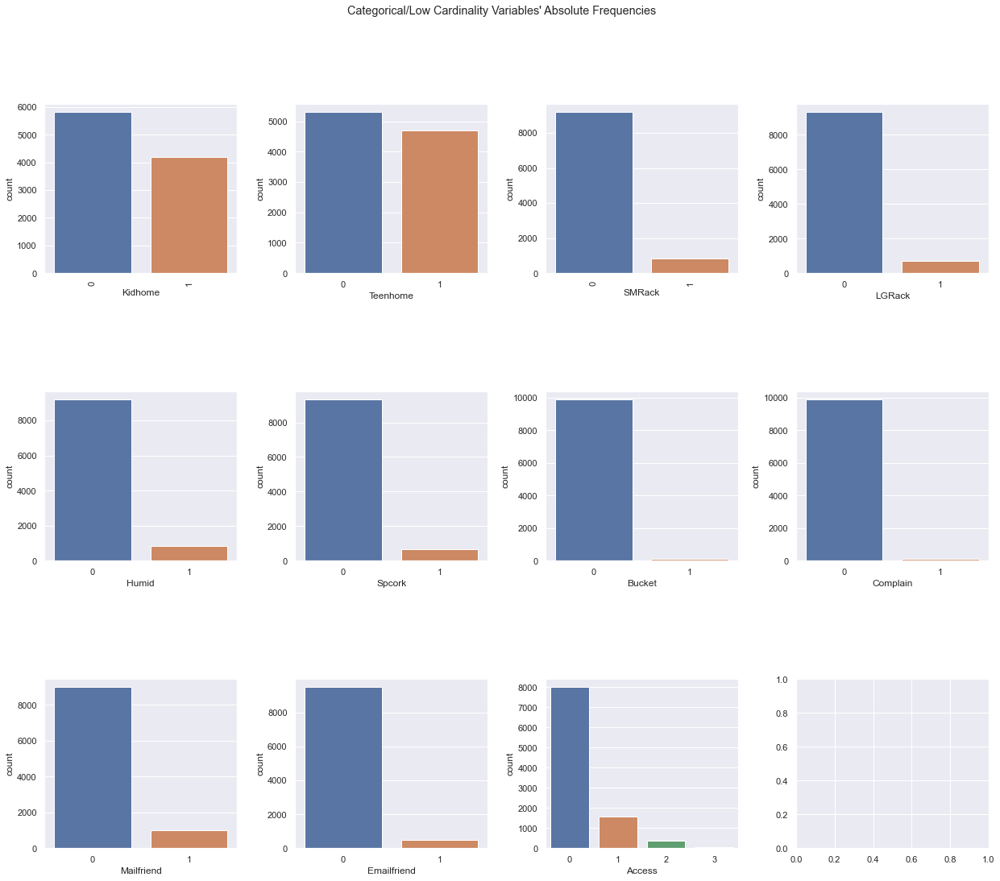

In [16]:
sns.set()

features = non_metric_features 
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(3, ceil(len(features) / 3), figsize=(21, 17))

# Plot data
# Iterate across axes objects and associate each bar plot:
for ax, feat in zip(axes.flatten(), features):
    sns.countplot(x=df[feat], ax=ax)

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)
# Rotating X-axis labels
axes.flatten()[0].tick_params(axis='x', labelrotation = 90)
axes.flatten()[2].tick_params(axis='x', labelrotation = 90)
plt.subplots_adjust(wspace=0.3, hspace=0.7)

plt.show()

#### Pairwise Relationship of Numerical Variables 

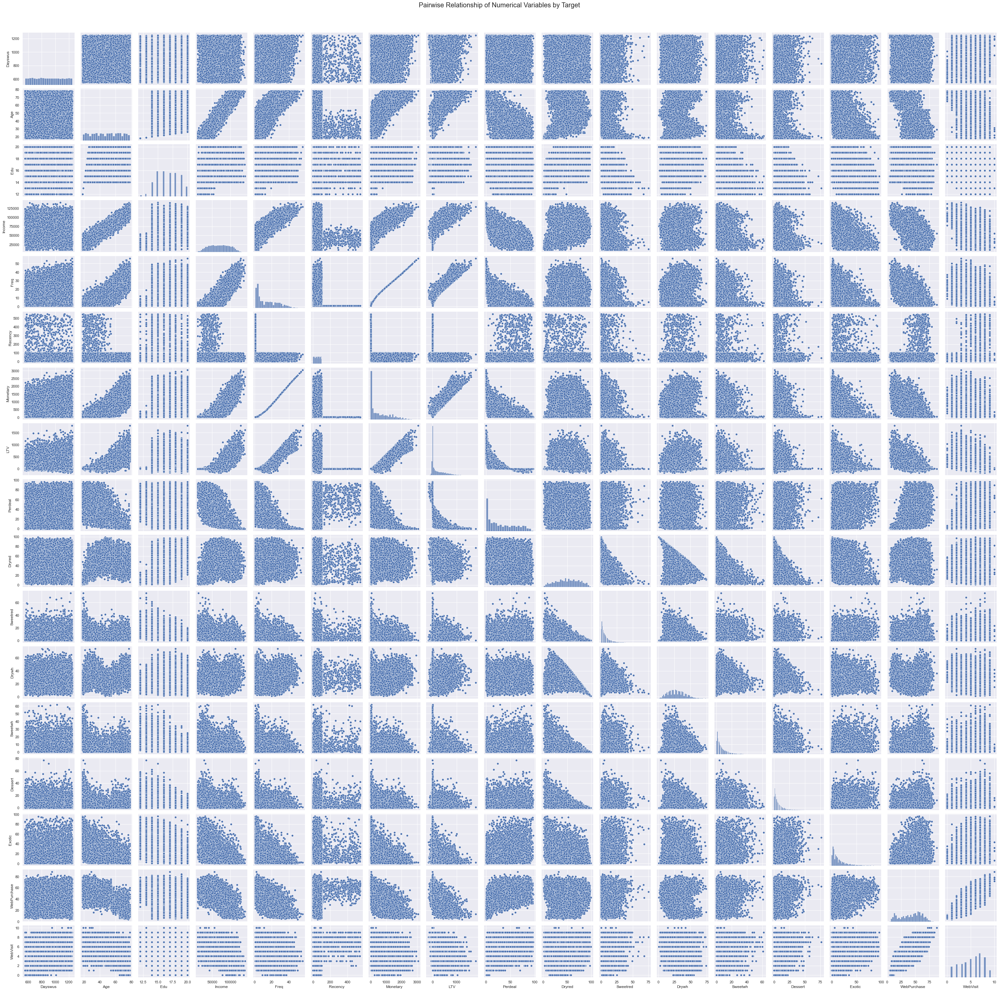

In [17]:
sns.set()
features = metric_features 

# Setting pairplot
sns.pairplot(data=df[features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables by Target", fontsize=20)

plt.show()

#### Box Plots of Numerical Variables 

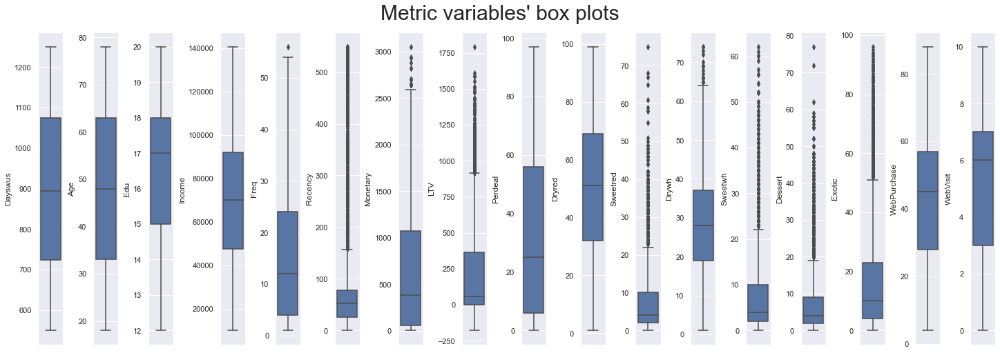

In [18]:
sns.set()
# Prepare figure
fig, axes = plt.subplots(1, len(metric_features), figsize=(20,7), constrained_layout=True)
    
# Plot data
for ax, f in zip(axes, metric_features):
    sns.boxplot(y=f, data=df[metric_features], ax=ax)

# Layout
plt.suptitle("Metric variables' box plots", fontsize=30)

plt.show()

#### Correlations of Numerical Variables 

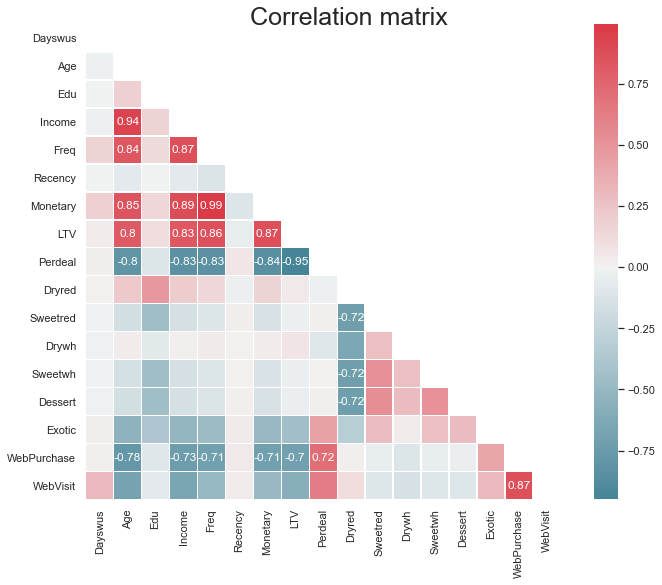

In [19]:
sns.set(style="white")

# Compute the correlation matrix
corr = df[metric_features].corr(method="spearman") #Getting correlation of numerical variables
mask = np.triu(np.ones_like(corr, dtype=bool))
# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(12, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

# Pass 2D Numpy array to annot parameter
mask_annot = np.absolute(corr.values)>=0.70 
annot_arr = np.where(mask_annot, corr.values.round(2), np.full(corr.shape,""))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask,cmap=cmap, center=0, square=True, linewidths=.5, annot=annot_arr, fmt="s", ax=ax)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Correlation matrix", fontsize=25)
plt.yticks(rotation=0)

plt.show()

In [20]:
# List of the highest correlations
c = df[metric_features].corr(method="spearman").abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
so=so[(so>=0.75)&(so!=1)]

print (so)

WebPurchase  Age            0.776495
Age          WebPurchase    0.776495
Perdeal      Age            0.803672
Age          Perdeal        0.803672
             LTV            0.804325
LTV          Age            0.804325
Freq         Perdeal        0.830090
Perdeal      Freq           0.830090
Income       LTV            0.833579
LTV          Income         0.833579
Income       Perdeal        0.833665
Perdeal      Income         0.833665
Age          Freq           0.836910
Freq         Age            0.836910
Perdeal      Monetary       0.841861
Monetary     Perdeal        0.841861
Age          Monetary       0.848669
Monetary     Age            0.848669
Freq         LTV            0.860717
LTV          Freq           0.860717
             Monetary       0.865892
Monetary     LTV            0.865892
WebPurchase  WebVisit       0.866893
WebVisit     WebPurchase    0.866893
Freq         Income         0.874078
Income       Freq           0.874078
Monetary     Income         0.889602
I

#### Heatmap of all Variables 

interval columns not set, guessing: ['Custid', 'Dayswus', 'Age', 'Edu', 'Income', 'Kidhome', 'Teenhome', 'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebPurchase', 'WebVisit', 'SMRack', 'LGRack', 'Humid', 'Spcork', 'Bucket', 'Access', 'Complain', 'Mailfriend', 'Emailfriend']


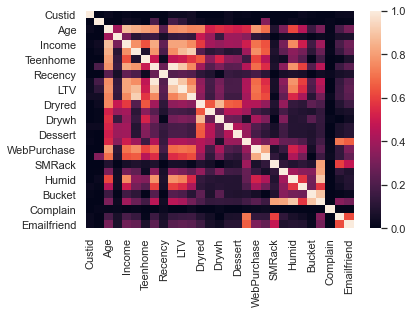

In [21]:
# Heatmap with phik
sns.heatmap(df.phik_matrix())

#### Observations: 
 - LTV, Sweetred, Dessert might contain outliers <br>
 - The company does not have a lot of complains <br>
 - High correlation between LTV and Perdeal and between Monetary and Freq
 - We can check that customers that buy a lot, spent a lot in their purchases
 - In these sample, none of the customers joined the company in its beginning (2013)
 - Only aorund 30% of the customers bought at least once in the last month
 - Around 40% of the customers bought at least half of their purchases online
              

## Data Preparation

### Coherence Checking

In [22]:
# We did not check if age is smaller than 18 since in describe we can see it.

In [23]:
df_clean=df.copy()

##### If web clicks = 0, then web purchases=0

In [24]:
df_clean.loc[(df_clean['WebPurchase'] > 0) & (df_clean['WebVisit'] == 0), "WebPurchase":]

,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend
287,10.0,0.0,0,0,1,1,0,1,0,0,0
294,7.0,0.0,0,0,0,0,0,0,0,0,0
544,11.0,0.0,0,0,0,0,0,0,0,0,0
910,7.0,0.0,0,0,1,0,0,1,0,0,0
938,12.0,0.0,0,0,0,0,0,0,1,0,0
1014,9.0,0.0,0,0,0,0,0,0,0,0,0
1131,8.0,0.0,0,0,0,0,0,0,0,0,0
1274,8.0,0.0,0,0,0,0,0,0,0,0,0
1408,6.0,0.0,0,0,0,0,0,0,0,0,0
1463,9.0,0.0,0,0,0,0,0,0,0,0,0


##### Sum of the accessories

In [25]:
df_clean.loc[(df_clean['Access'] == 0) & ((df_clean['SMRack'] != 0) | (df_clean['LGRack'] != 0) | (df_clean['Bucket'] != 0)| (df_clean['Humid'] != 0)), :]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend


In [26]:
df_clean.loc[(df_clean['Access'] !=(df_clean['SMRack'] +df_clean['LGRack']+df_clean['Bucket']+df_clean['Humid'])), :]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend


##### Sum of the wine types can not be greater than 100 

In [27]:
df_clean.loc[(df_clean['Dryred'] +df_clean['Sweetred']+df_clean['Drywh']+df_clean['Sweetwh']+df_clean['Dessert'])!=100, :]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend
1,3956,1041,75,18,105087.0,0,0,36.0,33.0,1852.0,...,4.0,0,0,0,1,0,0,0,0,0
8,9139,853,26,17,33186.0,1,1,2.0,86.0,21.0,...,8.0,0,0,0,0,0,0,0,0,0
9,6511,881,53,17,88538.0,0,1,17.0,12.0,651.0,...,5.0,0,0,0,0,0,0,0,0,0
10,2507,978,43,15,62181.0,0,1,12.0,62.0,391.0,...,7.0,0,0,0,0,0,0,0,0,0
11,10900,1119,61,19,79789.0,0,1,16.0,18.0,590.0,...,5.0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9960,2440,607,60,17,102403.0,0,0,29.0,80.0,1414.0,...,4.0,0,1,1,1,0,2,0,0,0
9961,7875,668,52,15,86976.0,1,1,8.0,18.0,223.0,...,6.0,0,0,0,0,0,0,0,1,0
9966,5776,667,64,18,103251.0,0,1,19.0,56.0,768.0,...,2.0,0,0,0,0,0,0,0,0,0
9978,7367,583,27,17,58306.0,1,1,1.0,445.0,19.0,...,7.0,0,0,0,0,0,0,0,0,0


In [28]:
sum_wines=df_clean['Dryred'] +df_clean['Sweetred']+df_clean['Drywh']+df_clean['Sweetwh']+df_clean['Dessert']
sum_wines.unique()

array([100.,  99., 101.])

##### Last purchase before being a client 

In [29]:
df_clean.loc[df_clean['Recency'] > df_clean['Dayswus'], :]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend


##### Age bigger than years of education 

In [30]:
df_clean.loc[df_clean['Age'] < df_clean['Edu'], :]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend


### Feature Engineering

In [31]:
df_clean.columns

Index(['Custid', 'Dayswus', 'Age', 'Edu', 'Income', 'Kidhome', 'Teenhome',
       'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'Dryred', 'Sweetred',
       'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebPurchase', 'WebVisit',
       'SMRack', 'LGRack', 'Humid', 'Spcork', 'Bucket', 'Access', 'Complain',
       'Mailfriend', 'Emailfriend'],
      dtype='object')

In [32]:
# Total of accessories
df_clean["total_access"]=df_clean["Spcork"]+df_clean["Access"]

# Expensive accessories
df_clean["access>=100"]=df_clean['LGRack'] + df_clean['Bucket'] 

# Cheap accessories
df_clean["access<100"]=df_clean['SMRack']+df_clean['Humid']+ df_clean['Spcork'] 

# Money spent per purchase
df_clean["avg_mnt_per_purchase"]=round(df_clean["Monetary"]/df_clean["Freq"],2)

# Average money spent per month
df_clean["avg_mnt_month"]=round(df_clean["Monetary"]/18,2)

#Average income per month
df_clean["avg_income_month"]=round(df_clean["Income"]/12,2)

# % of income spent on the company
df_clean["%_spent"]=round((df_clean["avg_mnt_month"]/df_clean["avg_income_month"])*100,2)

# Binarize LTV variable
df_clean["LTV_bin"]=df_clean["LTV"].copy()
df_clean.loc[df_clean['LTV_bin'] > 0, 'LTV_bin'] = 1
df_clean.loc[df_clean['LTV_bin'] <=0, 'LTV_bin'] = 0



In [33]:
df_clean['%_spent'].sort_values()

6734    0.01
4579    0.01
9982    0.01
4710    0.01
7408    0.01
        ... 
5917    1.64
8484    1.68
4271    1.68
5756    1.70
638     1.79
Name: %_spent, Length: 10000, dtype: float64

In [34]:
#Binarize %_spent
df_clean["%_spent_bin"]=df_clean["%_spent"].copy()
df_clean.loc[df_clean["%_spent_bin"] >= 1, "%_spent_bin"] = 1
df_clean.loc[df_clean["%_spent_bin"] <1, "%_spent_bin"] = 0


In [35]:
# Ration between freq and web visits
df_clean["purch_per_webvisit"]=round(((df_clean["Freq"]*(df_clean['WebPurchase']/100))/(df_clean["WebVisit"]*18))*100,2)
df_clean["purch_per_webvisit"]=df_clean["purch_per_webvisit"].map(lambda x: 0 if x==np.inf else x)

In [37]:
df_clean.head(5).transpose()

,0,1,2,3,4
Custid,5325.00,3956.00,3681.00,2829.00,8788.00
Dayswus,653.00,1041.00,666.00,1049.00,837.00
Age,55.00,75.00,18.00,42.00,47.00
Edu,20.00,18.00,12.00,16.00,16.00
Income,78473.00,105087.00,27984.00,61748.00,65789.00
Kidhome,0.00,0.00,1.00,1.00,0.00
Teenhome,0.00,0.00,0.00,1.00,1.00
Freq,20.00,36.00,4.00,2.00,2.00
Recency,18.00,33.00,56.00,46.00,3.00
Monetary,826.00,1852.00,39.00,37.00,36.00


In [38]:
df_clean[df_clean["Recency"]>365]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,total_access,access>=100,access<100,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,%_spent,LTV_bin,%_spent_bin,purch_per_webvisit
14,6523,736,36,15,40516.0,1,1,1.0,440.0,11.0,...,0,0,0,11.0,0.61,3376.33,0.02,0.0,0.0,0.48
38,4896,1100,45,18,51806.0,1,1,1.0,498.0,18.0,...,0,0,0,18.0,1.00,4317.17,0.02,0.0,0.0,0.50
161,3117,960,23,16,51453.0,1,0,1.0,465.0,20.0,...,0,0,0,20.0,1.11,4287.75,0.03,0.0,0.0,0.46
186,3142,1019,24,16,45638.0,1,1,1.0,495.0,19.0,...,0,0,0,19.0,1.06,3803.17,0.03,0.0,0.0,0.37
199,10073,776,25,17,45859.0,1,0,1.0,411.0,20.0,...,0,0,0,20.0,1.11,3821.58,0.03,0.0,0.0,0.52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9898,4725,1211,21,15,24370.0,0,0,1.0,510.0,13.0,...,0,0,0,13.0,0.72,2030.83,0.04,0.0,0.0,0.40
9906,4137,729,33,18,44301.0,1,1,1.0,527.0,14.0,...,0,0,0,14.0,0.78,3691.75,0.02,0.0,0.0,0.55
9974,8592,638,32,18,45877.0,1,1,1.0,398.0,17.0,...,0,0,0,17.0,0.94,3823.08,0.02,0.0,0.0,0.51
9978,7367,583,27,17,58306.0,1,1,1.0,445.0,19.0,...,0,0,0,19.0,1.06,4858.83,0.02,0.0,0.0,0.51


### Outlier Removal

In [39]:
df_clean.columns

Index(['Custid', 'Dayswus', 'Age', 'Edu', 'Income', 'Kidhome', 'Teenhome',
       'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'Dryred', 'Sweetred',
       'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebPurchase', 'WebVisit',
       'SMRack', 'LGRack', 'Humid', 'Spcork', 'Bucket', 'Access', 'Complain',
       'Mailfriend', 'Emailfriend', 'total_access', 'access>=100',
       'access<100', 'avg_mnt_per_purchase', 'avg_mnt_month',
       'avg_income_month', '%_spent', 'LTV_bin', '%_spent_bin',
       'purch_per_webvisit'],
      dtype='object')

In [40]:
# Define metric and non-metric features
non_metric_features = ['Kidhome', 'Teenhome', 'SMRack','LGRack','Humid','Spcork','Bucket','Access','Complain','Mailfriend','Emailfriend','LTV_bin','total_access', 'access>=100', 'access<100','%_spent_bin']
metric_features = df_clean.columns.drop(non_metric_features).drop("Custid").to_list()

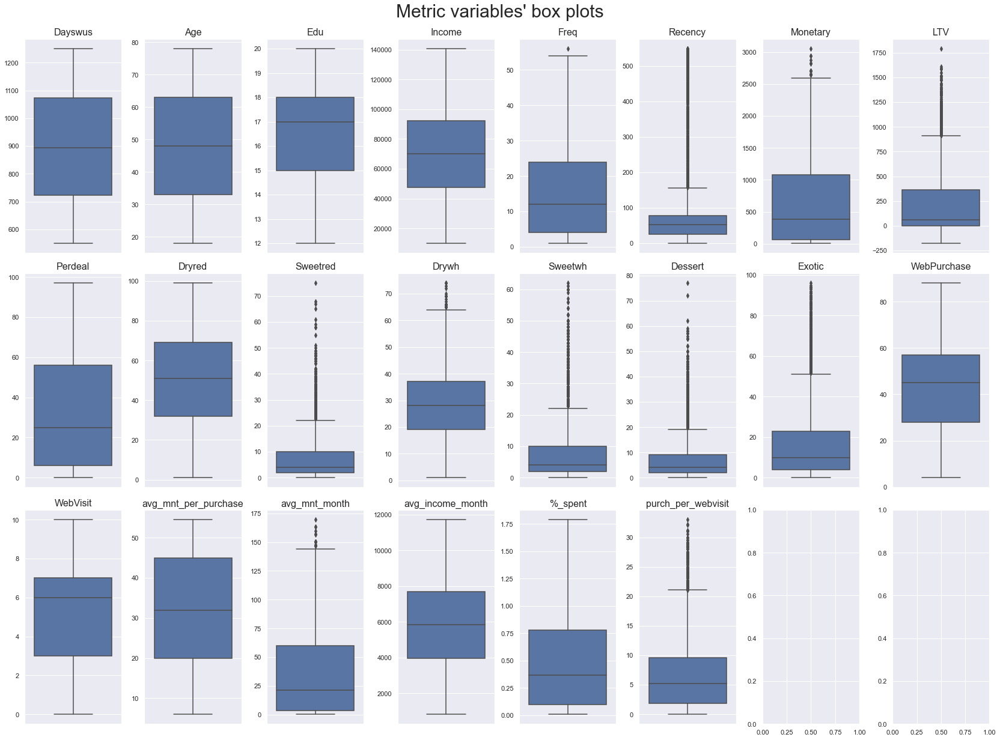

In [41]:
sns.set()
# Prepare figure
fig, axes = plt.subplots(3, 8, figsize=(23, 17), constrained_layout=True)
    
# Plot data
for ax, f in zip(axes.flat, df_clean[metric_features].columns):
    sns.boxplot(y=f, data=df_clean[metric_features], ax=ax)
    ax.set_title(f, size=16) # even because of aleasing
    ax.set_ylabel("")

# Layout
plt.suptitle("Metric variables' box plots", fontsize=30)

plt.show()

In [42]:
# Removing visual outliers
outliers = ((df_clean["LTV"]>1750) | (df_clean["Sweetred"]>70)| (df_clean["Dessert"]>70))
outliers_df=df_clean.loc[outliers]
new_df = df_clean.loc[~outliers]

In [43]:
print("There were removed",round(100-(new_df.shape[0]/df.shape[0]*100),3),"% of all observations.")

There were removed 0.04 % of all observations.


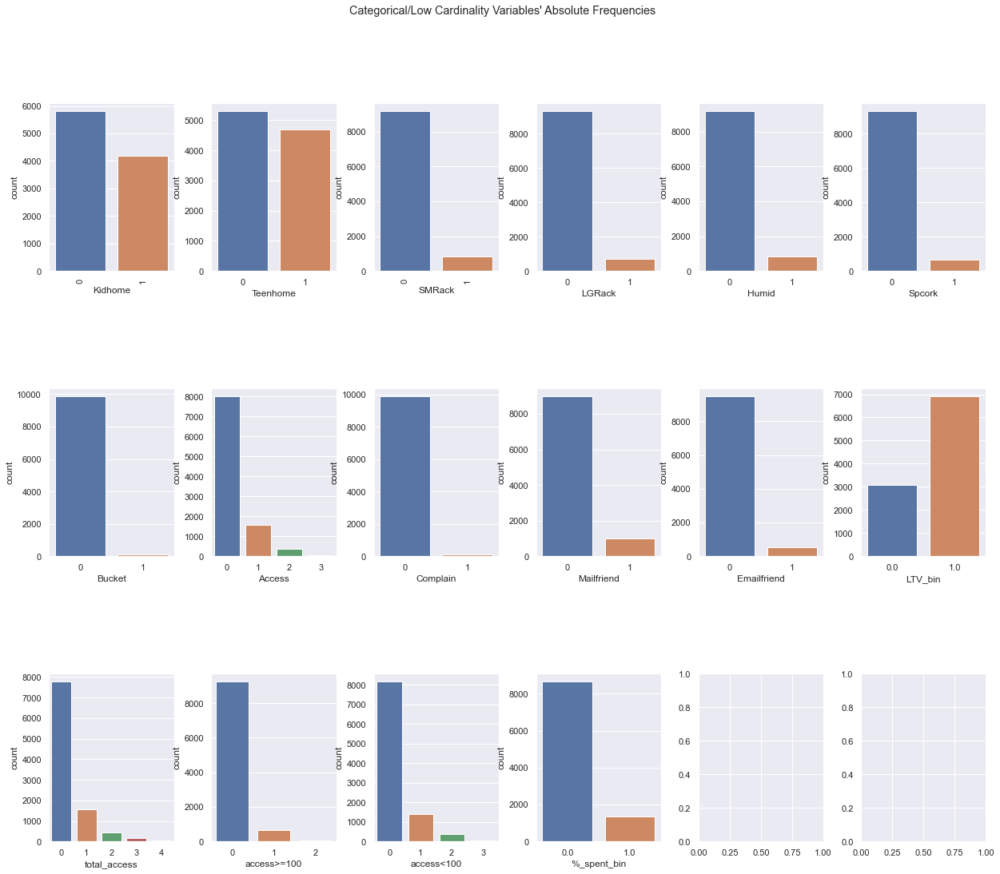

In [44]:
# All Non-Metric/ Low Cardinality Variables' Absolute Frequencies
sns.set()

features = non_metric_features 
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(3, ceil(len(features) / 3), figsize=(21, 17))

# Plot data
# Iterate across axes objects and associate each bar plot:
for ax, feat in zip(axes.flatten(), features):
    sns.countplot(x=new_df[feat], ax=ax)

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)
# Rotating X-axis labels
axes.flatten()[0].tick_params(axis='x', labelrotation = 90)
axes.flatten()[2].tick_params(axis='x', labelrotation = 90)
plt.subplots_adjust(wspace=0.3, hspace=0.7)

plt.show()

In [45]:
new_df["access>=100"].value_counts()

0    9244
1     679
2      73
Name: access>=100, dtype: int64

In [46]:
new_df["access<100"].value_counts()

0    8169
1    1400
2     367
3      60
Name: access<100, dtype: int64

In [47]:
new_df["total_access"].value_counts()

0    7774
1    1563
2     441
3     178
4      40
Name: total_access, dtype: int64

In [48]:
new_df["Complain"].value_counts()

0    9884
1     112
Name: Complain, dtype: int64

In [49]:
new_df["%_spent_bin"].value_counts()

0.0    8652
1.0    1344
Name: %_spent_bin, dtype: int64

## Feature Selection

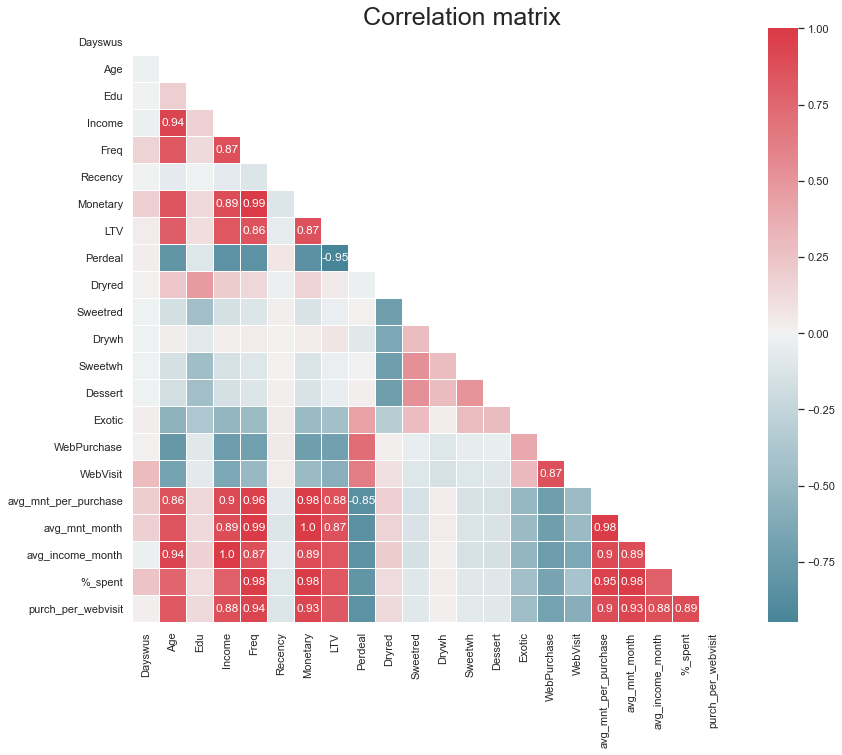

In [50]:
sns.set(style="white")

# Compute the correlation matrix
corr = new_df[metric_features].corr(method="spearman") #Getting correlation of numerical variables
mask = np.triu(np.ones_like(corr, dtype=bool))
# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(15, 10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True) 

# Pass 2D Numpy array to annot parameter
mask_annot = np.absolute(corr.values)>=0.85 
annot_arr = np.where(mask_annot, corr.values.round(2), np.full(corr.shape,""))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask,cmap=cmap, center=0, square=True, linewidths=.5, annot=annot_arr, fmt="s", ax=ax)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Correlation matrix", fontsize=25)
plt.yticks(rotation=0)

plt.show()

In [51]:
c = new_df[metric_features].corr(method="spearman").abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
so=so[(so>=0.85)&(so!=1)]

print (so)

Perdeal               avg_mnt_per_purchase    0.853421
avg_mnt_per_purchase  Perdeal                 0.853421
                      Age                     0.858422
Age                   avg_mnt_per_purchase    0.858422
LTV                   Freq                    0.860794
                                                ...   
avg_mnt_per_purchase  Monetary                0.980916
Freq                  Monetary                0.993472
                      avg_mnt_month           0.993472
Monetary              Freq                    0.993472
avg_mnt_month         Freq                    0.993472
Length: 68, dtype: float64


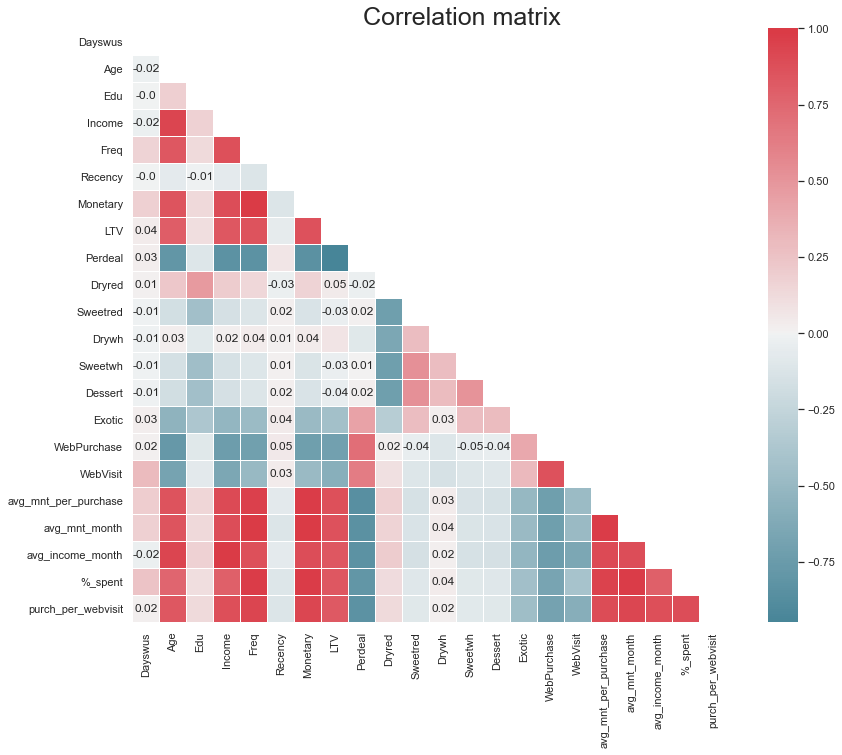

In [52]:
sns.set(style="white")

# Compute the correlation matrix
corr = new_df[metric_features].corr(method="spearman") #Getting correlation of numerical variables
mask = np.triu(np.ones_like(corr, dtype=bool))
# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(15, 10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True) 

# Pass 2D Numpy array to annot parameter
mask_annot = np.absolute(corr.values)<0.05
annot_arr = np.where(mask_annot, corr.values.round(2), np.full(corr.shape,""))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask,cmap=cmap, center=0, square=True, linewidths=.5, annot=annot_arr, fmt="s", ax=ax)

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Correlation matrix", fontsize=25)
plt.yticks(rotation=0)

plt.show()

In [53]:
new_df.columns

Index(['Custid', 'Dayswus', 'Age', 'Edu', 'Income', 'Kidhome', 'Teenhome',
       'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'Dryred', 'Sweetred',
       'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebPurchase', 'WebVisit',
       'SMRack', 'LGRack', 'Humid', 'Spcork', 'Bucket', 'Access', 'Complain',
       'Mailfriend', 'Emailfriend', 'total_access', 'access>=100',
       'access<100', 'avg_mnt_per_purchase', 'avg_mnt_month',
       'avg_income_month', '%_spent', 'LTV_bin', '%_spent_bin',
       'purch_per_webvisit'],
      dtype='object')

In [54]:
deleted_variables=['SMRack', 'LGRack', 'Humid', 'Spcork', 'Bucket', 'Access', 'Freq','Monetary','LTV','%_spent',"Income",'WebVisit']

In [55]:
df_final=new_df[new_df.columns.drop(deleted_variables).drop("Custid")]

In [56]:
df_final.head(5).transpose()

,0,1,2,3,4
Dayswus,653.00,1041.00,666.00,1049.00,837.00
Age,55.00,75.00,18.00,42.00,47.00
Edu,20.00,18.00,12.00,16.00,16.00
Kidhome,0.00,0.00,1.00,1.00,0.00
Teenhome,0.00,0.00,0.00,1.00,1.00
Recency,18.00,33.00,56.00,46.00,3.00
Perdeal,7.00,2.00,88.00,70.00,35.00
Dryred,67.00,49.00,4.00,86.00,85.00
Sweetred,4.00,0.00,29.00,1.00,0.00
Drywh,26.00,46.00,14.00,11.00,12.00


In [57]:
df_final.shape

(9996, 26)

In [58]:
# Define metric and non-metric features
non_metric_features = ['Kidhome', 'Teenhome','Complain','Mailfriend','Emailfriend','LTV_bin','total_access', 'access>=100', 'access<100','%_spent_bin']
metric_features = df_final.columns.drop(non_metric_features).to_list()

In [59]:
df_final[metric_features].dtypes

Dayswus                   int64
Age                       int64
Edu                       int64
Recency                 float64
Perdeal                 float64
Dryred                  float64
Sweetred                float64
Drywh                   float64
Sweetwh                 float64
Dessert                 float64
Exotic                  float64
WebPurchase             float64
avg_mnt_per_purchase    float64
avg_mnt_month           float64
avg_income_month        float64
purch_per_webvisit      float64
dtype: object

In [60]:
df_final[non_metric_features].shape

(9996, 10)

### Standardization

In [61]:
df_final.head()

,Dayswus,Age,Edu,Kidhome,Teenhome,Recency,Perdeal,Dryred,Sweetred,Drywh,...,Emailfriend,total_access,access>=100,access<100,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,LTV_bin,%_spent_bin,purch_per_webvisit
0,653,55,20,0,0,18.0,7.0,67.0,4.0,26.0,...,0,0,0,0,41.30,45.89,6539.42,1.0,0.0,8.00
1,1041,75,18,0,0,33.0,2.0,49.0,0.0,46.0,...,0,1,0,1,51.44,102.89,8757.25,1.0,1.0,10.00
2,666,18,12,1,0,56.0,88.0,4.0,29.0,14.0,...,0,0,0,0,9.75,2.17,2332.00,0.0,0.0,1.67
3,1049,42,16,1,1,46.0,70.0,86.0,1.0,11.0,...,1,0,0,0,18.50,2.06,5145.67,0.0,0.0,0.94
4,837,47,16,0,1,3.0,35.0,85.0,0.0,12.0,...,0,0,0,0,18.00,2.00,5482.42,1.0,0.0,1.17


In [62]:
df_final[metric_features]

,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
0,653,55,20,18.0,7.0,67.0,4.0,26.0,2.0,1.0,1.0,36.0,41.30,45.89,6539.42,8.00
1,1041,75,18,33.0,2.0,49.0,0.0,46.0,1.0,3.0,0.0,20.0,51.44,102.89,8757.25,10.00
2,666,18,12,56.0,88.0,4.0,29.0,14.0,32.0,21.0,48.0,60.0,9.75,2.17,2332.00,1.67
3,1049,42,16,46.0,70.0,86.0,1.0,11.0,1.0,1.0,55.0,59.0,18.50,2.06,5145.67,0.94
4,837,47,16,3.0,35.0,85.0,0.0,12.0,2.0,1.0,28.0,63.0,18.00,2.00,5482.42,1.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1132,57,20,59.0,22.0,78.0,0.0,20.0,1.0,1.0,11.0,27.0,40.84,43.11,6752.75,7.13
9996,596,66,15,45.0,5.0,30.0,12.0,36.0,10.0,12.0,13.0,18.0,40.00,40.00,7059.50,9.00
9997,619,18,12,65.0,23.0,6.0,24.0,10.0,38.0,22.0,41.0,58.0,15.67,2.61,3372.17,1.93
9998,1107,33,16,368.0,35.0,18.0,13.0,45.0,11.0,13.0,13.0,60.0,15.00,0.83,4471.75,0.56


In [63]:
df_stand=df_final.copy()

In [64]:
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df_stand[metric_features])
scaled_feat

array([[0.14714286, 0.61666667, 1.        , ..., 0.27969796, 0.52418363,
        0.24242424],
       [0.70142857, 0.95      , 0.75      , ..., 0.62962736, 0.72792212,
        0.3030303 ],
       [0.16571429, 0.        , 0.        , ..., 0.01129597, 0.13767366,
        0.05060606],
       ...,
       [0.09857143, 0.        , 0.        , ..., 0.01399718, 0.23322772,
        0.05848485],
       [0.79571429, 0.25      , 0.5       , ..., 0.00306956, 0.33423942,
        0.0169697 ],
       [0.61285714, 0.61666667, 0.5       , ..., 0.38952667, 0.65013637,
        0.28606061]])

In [65]:
print("Parameters fitted:\n", scaler.data_min_, "\n", scaler.data_max_)
df_stand[metric_features] = scaled_feat
df_stand.head()

Parameters fitted:
 [5.5000e+02 1.8000e+01 1.2000e+01 0.0000e+00 0.0000e+00 1.0000e+00
 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 4.0000e+00
 6.0000e+00 3.3000e-01 8.3333e+02 0.0000e+00] 
 [ 1250.      78.      20.     549.      97.      99.      68.      74.
    62.      62.      96.      88.      54.41   163.22 11719.      33.  ]


,Dayswus,Age,Edu,Kidhome,Teenhome,Recency,Perdeal,Dryred,Sweetred,Drywh,...,Emailfriend,total_access,access>=100,access<100,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,LTV_bin,%_spent_bin,purch_per_webvisit
0,0.147143,0.616667,1.00,0,0,0.032787,0.072165,0.673469,0.058824,0.342466,...,0,0,0,0,0.729188,0.279698,0.524184,1.0,0.0,0.242424
1,0.701429,0.950000,0.75,0,0,0.060109,0.020619,0.489796,0.000000,0.616438,...,0,1,0,1,0.938649,0.629627,0.727922,1.0,1.0,0.303030
2,0.165714,0.000000,0.00,1,0,0.102004,0.907216,0.030612,0.426471,0.178082,...,0,0,0,0,0.077463,0.011296,0.137674,0.0,0.0,0.050606
3,0.712857,0.400000,0.50,1,1,0.083789,0.721649,0.867347,0.014706,0.136986,...,1,0,0,0,0.258211,0.010621,0.396148,0.0,0.0,0.028485
4,0.410000,0.483333,0.50,0,1,0.005464,0.360825,0.857143,0.000000,0.150685,...,0,0,0,0,0.247883,0.010252,0.427083,1.0,0.0,0.035455


In [66]:
#Checking max and min of minmaxed variables
df_stand[metric_features].describe().round(2)

,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
count,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00,9996.00
mean,0.50,0.50,0.59,0.11,0.33,0.50,0.10,0.38,0.11,0.11,0.17,0.46,0.54,0.21,0.46,0.19
std,0.29,0.29,0.23,0.13,0.29,0.24,0.12,0.17,0.13,0.13,0.18,0.22,0.28,0.22,0.21,0.16
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.25,0.25,0.38,0.05,0.06,0.32,0.03,0.25,0.03,0.03,0.04,0.29,0.29,0.02,0.29,0.06
50%,0.49,0.50,0.62,0.09,0.26,0.51,0.06,0.37,0.06,0.06,0.10,0.49,0.54,0.13,0.46,0.16
75%,0.75,0.75,0.75,0.14,0.58,0.69,0.15,0.49,0.16,0.15,0.24,0.63,0.80,0.37,0.63,0.29
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


## Segmentation: K-means

In [67]:
df_stand[metric_features].columns

Index(['Dayswus', 'Age', 'Edu', 'Recency', 'Perdeal', 'Dryred', 'Sweetred',
       'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebPurchase',
       'avg_mnt_per_purchase', 'avg_mnt_month', 'avg_income_month',
       'purch_per_webvisit'],
      dtype='object')

In [68]:
customer_characteristics=['Dayswus', 'Age', 'Edu', 'Recency', 'WebPurchase','avg_mnt_per_purchase', 'avg_mnt_month', 'avg_income_month',
       'purch_per_webvisit']
df_cc = df_stand[customer_characteristics].copy()

In [69]:
preferences=['Perdeal', 'Dryred', 'Sweetred','Drywh', 'Sweetwh', 'Dessert', 'Exotic']
df_prf = df_stand[preferences].copy()

In [70]:
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst

def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    r2_clust = { }
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust

# Set up the clusterers
kmeans = KMeans(
        init='k-means++',
        n_init=10,
        random_state=1
            )
hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [71]:
# Obtaining the R² scores for each cluster solution - Perspective CC
r2_scores = {}
r2_scores['kmeans_cc'] = get_r2_scores(df_cc, kmeans)
r2_scores['kmeans_prf'] = get_r2_scores(df_prf, kmeans)
for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_cc, hierarchical.set_params(linkage=linkage)
    )
for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_prf, hierarchical.set_params(linkage=linkage)
    )
pd.DataFrame(r2_scores)

,kmeans_cc,kmeans_prf,complete,average,single,ward
2,0.455083,0.304820,0.112047,0.163339,0.000508,0.286331
3,0.538620,0.473740,0.298583,0.165250,0.000863,0.433414
4,0.597546,0.576248,0.381524,0.165737,0.002293,0.534335
5,0.643355,0.619580,0.388040,0.166858,0.002810,0.573355
6,0.675972,0.650127,0.398764,0.167331,0.002840,0.595799
7,0.699607,0.672284,0.401783,0.171800,0.003669,0.615426
8,0.718345,0.689662,0.406035,0.172199,0.004171,0.634360
9,0.735386,0.704554,0.435042,0.185214,0.004632,0.650424


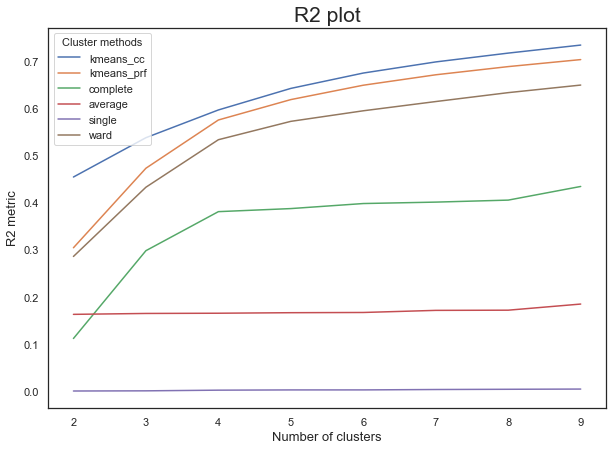

In [72]:
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("R2 plot", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

In [73]:
# Obtaining the R² scores for each cluster solution - Perspective PRF
r2_scores = {}
r2_scores['kmeans_prf'] = get_r2_scores(df_prf, kmeans)
for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_prf, hierarchical.set_params(linkage=linkage)
    )
pd.DataFrame(r2_scores)

,kmeans_prf,complete,average,single,ward
2,0.304820,0.112047,0.163339,0.000508,0.286331
3,0.473740,0.298583,0.165250,0.000863,0.433414
4,0.576248,0.381524,0.165737,0.002293,0.534335
5,0.619580,0.388040,0.166858,0.002810,0.573355
6,0.650127,0.398764,0.167331,0.002840,0.595799
7,0.672284,0.401783,0.171800,0.003669,0.615426
8,0.689662,0.406035,0.172199,0.004171,0.634360
9,0.704554,0.435042,0.185214,0.004632,0.650424


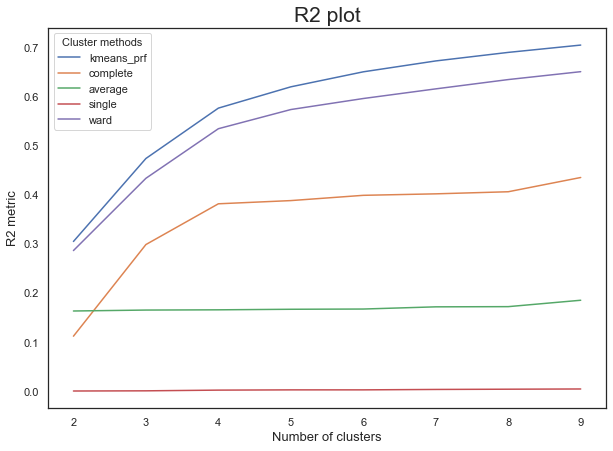

In [74]:
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("R2 plot", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

### Perspective One: Customer Characteristics

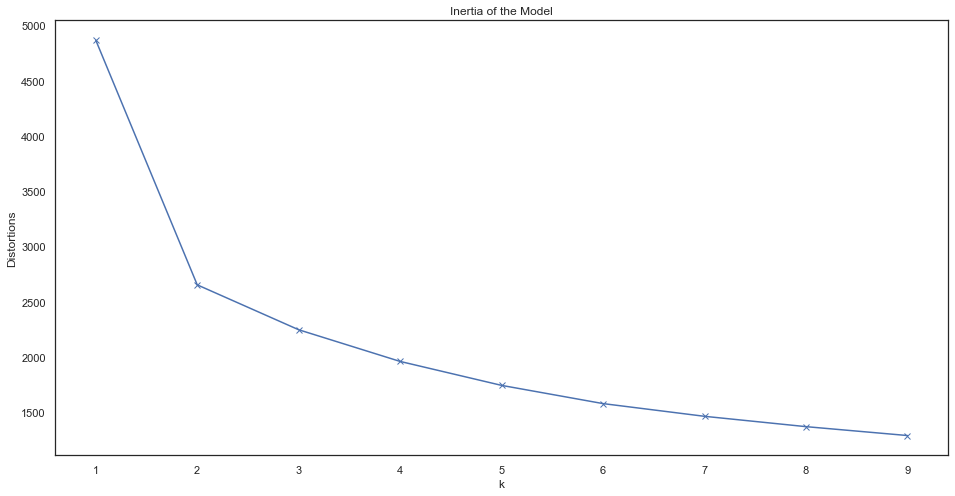

In [75]:
distortions = []
for k in range(1, 10):
    kmeanModel = KMeans(n_clusters=k).fit(df_cc)
    distortions.append(kmeanModel.inertia_)


plt.figure(figsize=(16,8))
plt.plot(range(1, 10), distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortions')
plt.title('Inertia of the Model')
plt.show()

#### 2 Cluster Solution:

In [76]:
kmclust = KMeans(n_clusters=2, init='k-means++',n_init=15, random_state=1)
km_labels2 = kmclust.fit_predict(df_cc)
# Caracterizing clusters formed --> using the dataset with the original scales to evaluate better
cluster_cc2 = pd.concat((df_cc, pd.Series(km_labels2, name='labels')), axis=1)
cluster_cc2.groupby('labels').mean()

,Dayswus,Age,Edu,Recency,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
labels,,,,,,,,,
0.0,0.495448,0.409566,0.585310,0.121374,0.514387,0.445309,0.143237,0.393098,0.145065
1.0,0.499443,0.608396,0.601448,0.104106,0.386303,0.647092,0.292478,0.538985,0.255719


In [77]:
pd.Series(km_labels2).value_counts()

0    5504
1    4492
dtype: int64

In [78]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(s=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-45)
        
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.show()

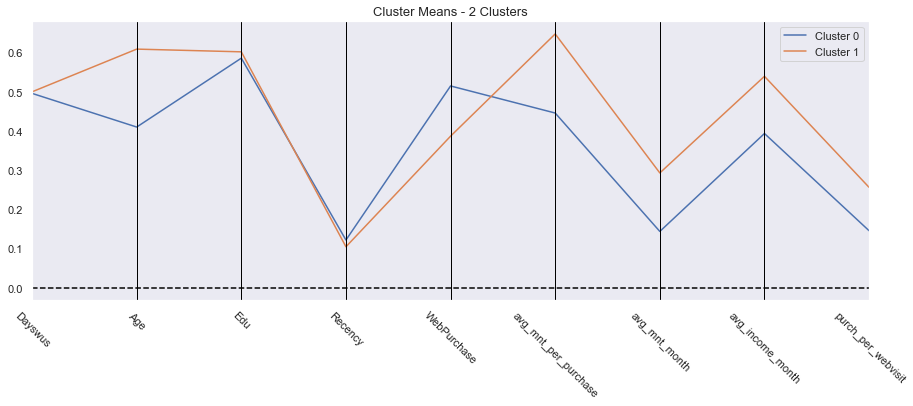

In [79]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=cluster_cc2, label_columns = ['labels'],figsize = (15, 5))

#### 3 Cluster Solution:

In [80]:
kmclust3 = KMeans(n_clusters=3, init='k-means++',n_init=15, random_state=1)
km_labels3 = kmclust3.fit_predict(df_cc)
# Caracterizing clusters formed --> using the dataset with the original scales to evaluate better
cluster_cc3 = pd.concat((df_cc, pd.Series(km_labels3, name='labels')), axis=1)
cluster_cc3.groupby('labels').mean()

,Dayswus,Age,Edu,Recency,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
labels,,,,,,,,,
0.0,0.500012,0.524603,0.617815,0.101192,0.463384,0.563893,0.199939,0.479349,0.197087
1.0,0.492442,0.379191,0.572095,0.128655,0.525454,0.413960,0.132053,0.370147,0.133793
2.0,0.500810,0.632653,0.593866,0.106315,0.358183,0.670509,0.325768,0.555764,0.274077


In [81]:
pd.Series(km_labels3).value_counts()

1    3969
0    3062
2    2965
dtype: int64

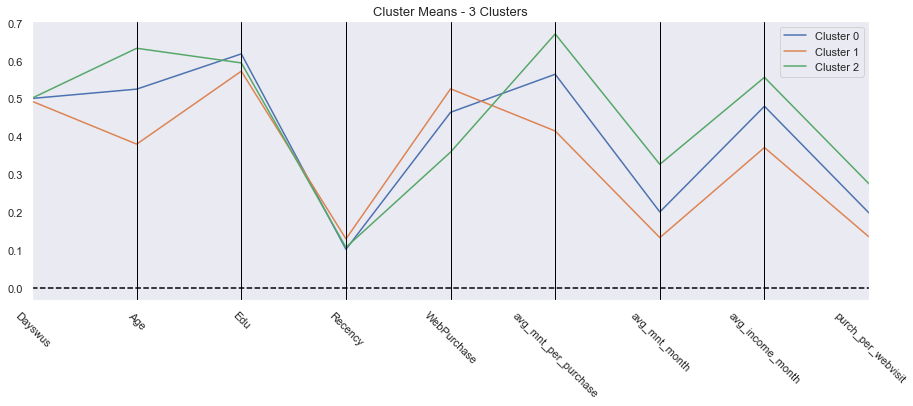

In [82]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=cluster_cc3, label_columns = ['labels'],figsize = (15, 5))

### Perspective Two: Customer Preferences

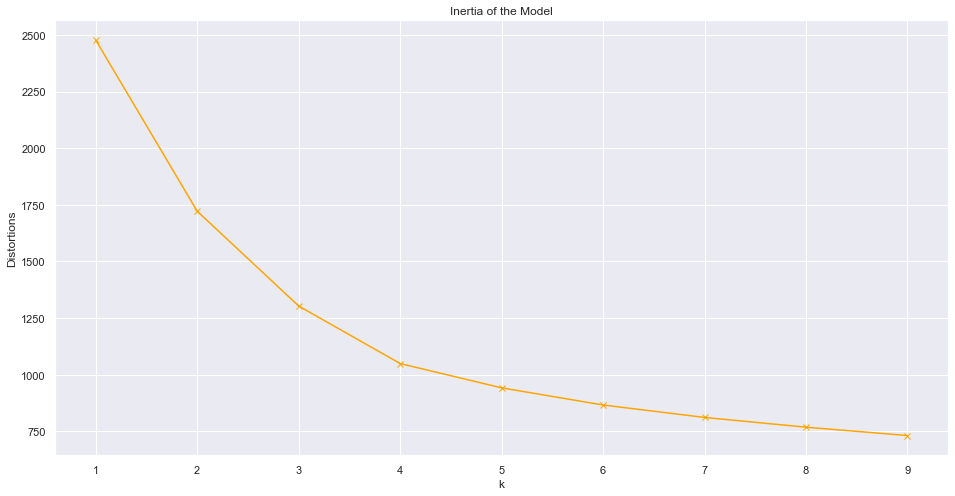

In [83]:
distortions = []
for k in range(1, 10):
    kmeanModel = KMeans(n_clusters=k).fit(df_prf)
    distortions.append(kmeanModel.inertia_)


plt.figure(figsize=(16,8))
plt.plot(range(1, 10), distortions, 'bx-', color="orange")
plt.xlabel('k')
plt.ylabel('Distortions')
plt.title('Inertia of the Model')
plt.show()

#### 2 Cluster Solution:

In [84]:
kmclust4 = KMeans(n_clusters=2, init='k-means++',n_init=15, random_state=1)
km_labels4 = kmclust4.fit_predict(df_prf)
# Caracterizing clusters formed --> using the dataset with the original scales to evaluate better
cluster_cp2 = pd.concat((df_prf, pd.Series(km_labels4, name='labels')), axis=1)
cluster_cp2.groupby('labels').mean()

,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic
labels,,,,,,,
0.0,0.257795,0.532724,0.093164,0.367500,0.103320,0.100101,0.143504
1.0,0.456950,0.457951,0.120469,0.392622,0.131162,0.130673,0.218627


In [85]:
pd.Series(km_labels4).value_counts()

0    6169
1    3827
dtype: int64

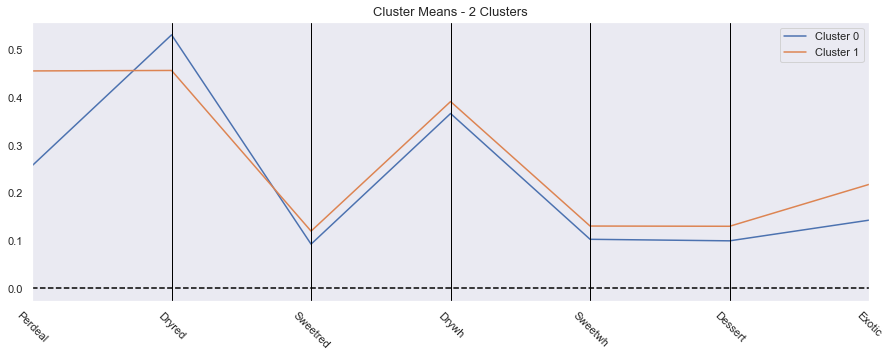

In [86]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=cluster_cp2, label_columns = ['labels'],figsize = (15, 5))

#### 3 Cluster Solution:

In [87]:
kmclust5 = KMeans(n_clusters=3, init='k-means++',n_init=15, random_state=1)
km_labels5 = kmclust5.fit_predict(df_prf)
# Caracterizing clusters formed --> using the dataset with the original scales to evaluate better
cluster_cp3 = pd.concat((df_prf, pd.Series(km_labels5, name='labels')), axis=1)
cluster_cp3.groupby('labels').mean()

,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic
labels,,,,,,,
0.0,0.334693,0.613314,0.073871,0.314635,0.080546,0.078739,0.147855
1.0,0.237057,0.461240,0.109542,0.415981,0.122381,0.119104,0.147133
2.0,0.460633,0.419926,0.134096,0.406422,0.145946,0.144749,0.236685


In [88]:
pd.Series(km_labels5).value_counts()

1    3648
0    3571
2    2777
dtype: int64

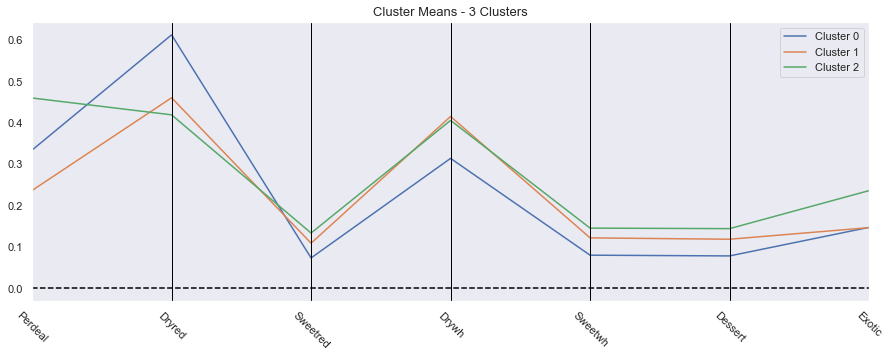

In [89]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=cluster_cp3, label_columns = ['labels'],figsize = (15, 5))

#### 4 Cluster Solution:

In [90]:
kmclust6 = KMeans(n_clusters=4, init='k-means++',n_init=15, random_state=1)
km_labels6 = kmclust6.fit_predict(df_prf)
# Caracterizing clusters formed --> using the dataset with the original scales to evaluate better
cluster_cp4 = pd.concat((df_prf, pd.Series(km_labels6, name='labels')), axis=1)
cluster_cp4.groupby('labels').mean()

,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic
labels,,,,,,,
0.0,0.275817,0.614312,0.074396,0.310585,0.082812,0.079197,0.141503
1.0,0.240291,0.449327,0.112227,0.425912,0.124654,0.121052,0.148645
2.0,0.432757,0.365743,0.160703,0.393765,0.179477,0.182377,0.273135
3.0,0.476916,0.535949,0.089694,0.381117,0.093803,0.092067,0.176816


In [91]:
pd.Series(km_labels6).value_counts()

1    3265
0    2919
3    2259
2    1553
dtype: int64

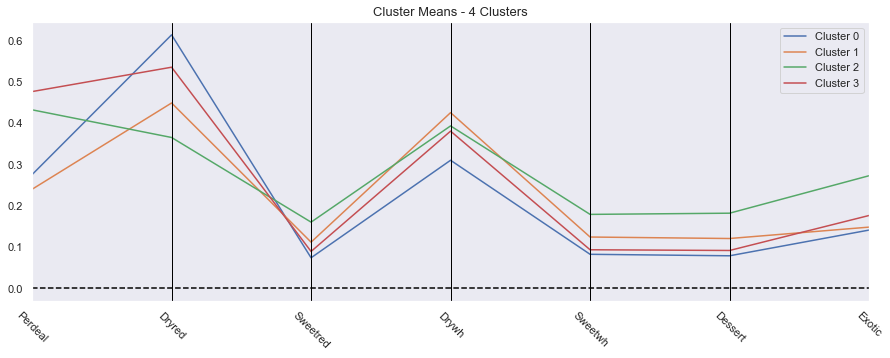

In [92]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=cluster_cp4, label_columns = ['labels'],figsize = (15, 5))

### Combination of the Perspectives:

##### 1 - Experimenting with (3,4) clusters

In [93]:
df_34 = df_stand.copy().drop(columns=['Kidhome', 'Teenhome', 'Complain', 'Mailfriend', 'Emailfriend', 'LTV_bin', 'total_access', 'access>=100', 'access<100', '%_spent_bin'])

In [94]:
df_34

,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
0,0.147143,0.616667,1.000,0.032787,0.072165,0.673469,0.058824,0.342466,0.032258,0.016129,0.010417,0.380952,0.729188,0.279698,0.524184,0.242424
1,0.701429,0.950000,0.750,0.060109,0.020619,0.489796,0.000000,0.616438,0.016129,0.048387,0.000000,0.190476,0.938649,0.629627,0.727922,0.303030
2,0.165714,0.000000,0.000,0.102004,0.907216,0.030612,0.426471,0.178082,0.516129,0.338710,0.500000,0.666667,0.077463,0.011296,0.137674,0.050606
3,0.712857,0.400000,0.500,0.083789,0.721649,0.867347,0.014706,0.136986,0.016129,0.016129,0.572917,0.654762,0.258211,0.010621,0.396148,0.028485
4,0.410000,0.483333,0.500,0.005464,0.360825,0.857143,0.000000,0.150685,0.032258,0.016129,0.291667,0.702381,0.247883,0.010252,0.427083,0.035455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.831429,0.650000,1.000,0.107468,0.226804,0.785714,0.000000,0.260274,0.016129,0.016129,0.114583,0.273810,0.719686,0.262631,0.543781,0.216061
9996,0.065714,0.800000,0.375,0.081967,0.051546,0.295918,0.176471,0.479452,0.161290,0.193548,0.135417,0.166667,0.702334,0.243539,0.571960,0.272727
9997,0.098571,0.000000,0.000,0.118397,0.237113,0.051020,0.352941,0.123288,0.612903,0.354839,0.427083,0.642857,0.199752,0.013997,0.233228,0.058485
9998,0.795714,0.250000,0.500,0.670310,0.360825,0.173469,0.191176,0.602740,0.177419,0.209677,0.135417,0.666667,0.185912,0.003070,0.334239,0.016970


In [95]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_cc= KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
cc_labels = kmeans_cc.fit_predict(df_cc)

kmeans_prf = KMeans(
    n_clusters=4,
    init='k-means++',
    n_init=20,
    random_state=42
)
prf_labels = kmeans_prf.fit_predict(df_prf)

df_34['cc_labels'] = cc_labels
df_34['prf_labels'] = prf_labels

In [96]:
# Count label frequencies (contigency table)
df_34.groupby(['cc_labels', 'prf_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('prf_labels', 'cc_labels', 0)

cc_labels,0,1,2
prf_labels,,,
0,69,1483,8
1,729,413,2128
2,460,1787,10
3,1808,288,813


In [97]:
# Centroids of the concatenated cluster labels
df_centroids = df_34.groupby(['prf_labels', 'cc_labels']).mean()
#df_centroids

In [98]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

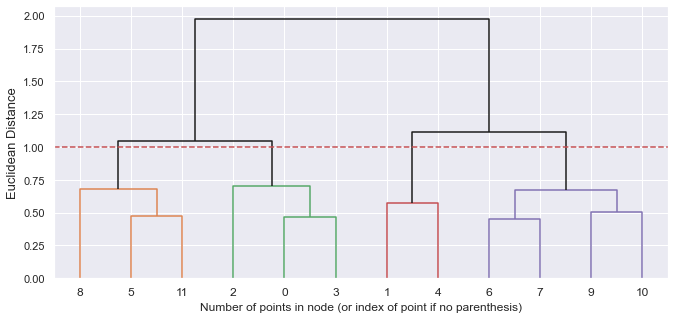

In [99]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 1
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [100]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=4
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

#df_centroids

In [101]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

# Mapping the hierarchical clusters on the centroids to the observations
df_34['merged_labels_34'] = df_34.apply(lambda row: cluster_mapper[(row['prf_labels'], row['cc_labels'])], axis=1)
df_34.drop(columns=['prf_labels','cc_labels']).groupby('merged_labels_34').mean()


,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
merged_labels_34,,,,,,,,,,,,,,,,
0,0.490537,0.583912,0.543114,0.091484,0.183469,0.408151,0.135765,0.414664,0.147002,0.151565,0.164508,0.397495,0.603096,0.181461,0.513922,0.209331
1,0.512117,0.837682,0.619324,0.091567,0.045999,0.471248,0.099114,0.437790,0.107984,0.103256,0.079412,0.202639,0.868876,0.497384,0.704643,0.389574
2,0.481468,0.130169,0.414293,0.148876,0.530096,0.208689,0.221023,0.437352,0.249149,0.244079,0.367517,0.636327,0.232116,0.023776,0.207678,0.054429
3,0.495172,0.413854,0.661150,0.117417,0.471955,0.672997,0.049559,0.302594,0.053066,0.052569,0.151561,0.562202,0.429935,0.101969,0.390807,0.120979


##### 2 - Experimenting with (3,3) clusters

In [102]:
df_33 = df_stand.copy().drop(columns=['Kidhome', 'Teenhome', 'Complain', 'Mailfriend', 'Emailfriend', 'LTV_bin', 'total_access', 'access>=100', 'access<100', '%_spent_bin'])

In [103]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_cc_33= KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
cc_labels_33 = kmeans_cc_33.fit_predict(df_cc)

kmeans_prf_33 = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
prf_labels_33 = kmeans_prf_33.fit_predict(df_prf)

df_33['cc_labels_33'] = cc_labels_33
df_33['prf_labels_33'] = prf_labels_33

In [104]:
# Centroids of the concatenated cluster labels
df_centroids_33 = df_33.groupby(['prf_labels_33', 'cc_labels_33']).mean()
#df_centroids_33

In [105]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids_33)

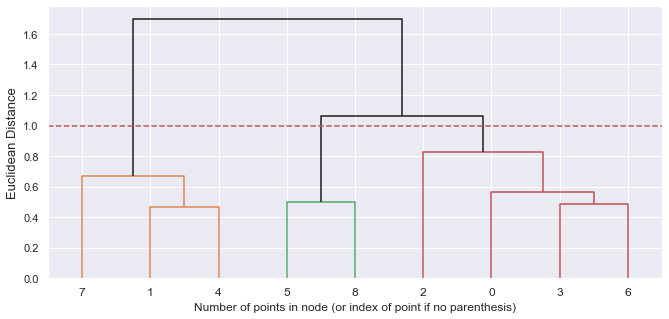

In [106]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 1
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [107]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=3
)
hclust_labels_33 = hclust.fit_predict(df_centroids_33)
df_centroids_33['hclust_labels_33'] = hclust_labels_33


In [108]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids_33['hclust_labels_33'].to_dict()

# Mapping the hierarchical clusters on the centroids to the observations
df_33['merged_labels_33'] = df_33.apply(lambda row: cluster_mapper[(row['prf_labels_33'], row['cc_labels_33'])], axis=1)
df_33.drop(columns=['prf_labels_33','cc_labels_33']).groupby('merged_labels_33').mean()

,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
merged_labels_33,,,,,,,,,,,,,,,,
0,0.523856,0.544141,0.642334,0.091191,0.276022,0.663969,0.062730,0.276042,0.068060,0.068690,0.134186,0.480821,0.591430,0.175944,0.492107,0.189715
1,0.465909,0.211882,0.534059,0.147465,0.593156,0.404774,0.138637,0.410276,0.154056,0.151392,0.270272,0.627301,0.245589,0.023507,0.249776,0.053457
2,0.511554,0.837730,0.619116,0.091580,0.045723,0.471064,0.099211,0.437628,0.108080,0.103542,0.080092,0.202639,0.868723,0.497162,0.704721,0.390072


##### 3 - Experimenting with (2,3) clusters

In [109]:
df_23 = df_stand.copy().drop(columns=['Kidhome', 'Teenhome', 'Complain', 'Mailfriend', 'Emailfriend', 'LTV_bin', 'total_access', 'access>=100', 'access<100', '%_spent_bin'])

In [110]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_cc_23= KMeans(
    n_clusters=2,
    init='k-means++',
    n_init=20,
    random_state=42
)
cc_labels_23 = kmeans_cc_23.fit_predict(df_cc)

kmeans_prf_23 = KMeans(
    n_clusters=3,
    init='k-means++',
    n_init=20,
    random_state=42
)
prf_labels_23 = kmeans_prf_23.fit_predict(df_prf)

df_23['cc_labels_23'] = cc_labels_23
df_23['prf_labels_23'] = prf_labels_23

In [111]:
# Centroids of the concatenated cluster labels
df_centroids_23 = df_23.groupby(['prf_labels_23', 'cc_labels_23']).mean()
df_centroids_23

Dayswus       Age       Edu   Recency   Perdeal  \
prf_labels_23 cc_labels_23                                                     
0             0             0.643893  0.632500  0.453125  0.092577  0.485825   
              1             0.499993  0.180924  0.472161  0.147632  0.644686   
1             0             0.496602  0.812018  0.588292  0.091392  0.056122   
              1             0.464275  0.306047  0.568216  0.120292  0.230900   
2             0             0.554630  0.666983  0.703136  0.091734  0.164459   
              1             0.461605  0.409066  0.688277  0.114687  0.472827   

                              Dryred  Sweetred     Drywh   Sweetwh   Dessert  \
prf_labels_23 cc_labels_23                                                     
0             0             0.372959  0.163971  0.350685  0.186694  0.212903   
              1             0.303865  0.173824  0.447229  0.192471  0.190581   
1             0             0.415039  0.115922  0.467177  0.125410  0.121825   
              1             0.379020  0.131846  0.462365  0.151569  0.140881   
2             0             0.762996  0.036810  0.216717  0.039267  0.038863   
              1             0.752692  0.031317  0.243255  0.034532  0.034771   

                              Exotic  WebPurchase  avg_mnt_per_purchase  \
prf_labels_23 cc_labels_23                                                
0             0             0.256771     0.360417              0.642383   
              1             0.325476     0.629814              0.231947   
1             0             0.092929     0.213092              0.827618   
              1             0.180129     0.554955              0.411888   
2             0             0.087853     0.410928              0.758650   
              1             0.140197     0.580824              0.398627   

                            avg_mnt_month  avg_income_month  \
prf_labels_23 cc_labels_23                                    
0             0                  0.210285          0.544953   
              1                  0.024369          0.228633   
1             0                  0.446472          0.680388   
              1                  0.075416          0.349445   
2             0                  0.337536          0.591063   
              1                  0.070181          0.383430   

                            purch_per_webvisit  
prf_labels_23 cc_labels_23                      
0             0                       0.198833  
              1                       0.054125  
1             0                       0.369036  
              1                       0.107494  
2             0                       0.277684  
              1                       0.099734

In [112]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids_23)

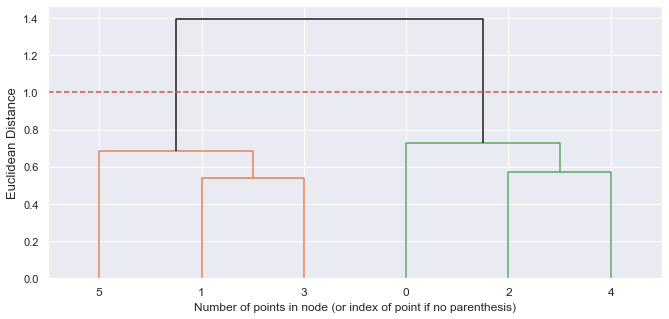

In [113]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 1
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [114]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=2
)
hclust_labels_23 = hclust.fit_predict(df_centroids_23)
df_centroids_23['hclust_labels_23'] = hclust_labels_23

#df_centroids_23

In [115]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids_23['hclust_labels_23'].to_dict()

# Mapping the hierarchical clusters on the centroids to the observations
df_23['merged_labels_23'] = df_23.apply(lambda row: cluster_mapper[(row['prf_labels_23'], row['cc_labels_23'])], axis=1)
df_23.drop(columns=['prf_labels_23','cc_labels_23']).groupby('merged_labels_23').mean()


,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
merged_labels_23,,,,,,,,,,,,,,,,
0,0.516940,0.762861,0.624750,0.091515,0.095470,0.528768,0.090406,0.384009,0.097707,0.095430,0.092722,0.279278,0.803355,0.408648,0.649892,0.337566
1,0.481053,0.282912,0.566047,0.131780,0.529094,0.483762,0.114507,0.371453,0.127413,0.125265,0.237344,0.602091,0.317199,0.047993,0.302190,0.077954


##### 4 - Experimenting with (2,4) clusters

In [116]:
df_24 = df_stand.copy().drop(columns=['Kidhome', 'Teenhome', 'Complain', 'Mailfriend', 'Emailfriend', 'LTV_bin', 'total_access', 'access>=100', 'access<100', '%_spent_bin'])

In [117]:
# Applying the right clustering (algorithm and number of clusters) for each perspective
kmeans_cc_24= KMeans(
    n_clusters=2,
    init='k-means++',
    n_init=20,
    random_state=42
)
cc_labels_24 = kmeans_cc_24.fit_predict(df_cc)

kmeans_prf_24 = KMeans(
    n_clusters=4,
    init='k-means++',
    n_init=20,
    random_state=42
)
prf_labels_24 = kmeans_prf_24.fit_predict(df_prf)

df_24['cc_labels_24'] = cc_labels_24
df_24['prf_labels_24'] = prf_labels_24


In [118]:
# Centroids of the concatenated cluster labels
df_centroids_24 = df_24.groupby(['prf_labels_24', 'cc_labels_24']).mean()
#df_centroids_24

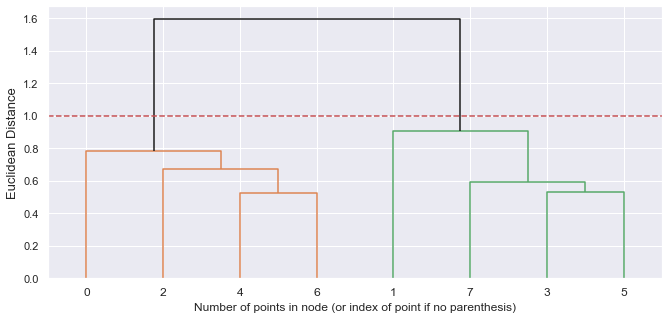

In [119]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids_24)

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 1
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [120]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=2
)
hclust_labels_24 = hclust.fit_predict(df_centroids_24)
df_centroids_24['hclust_labels_24'] = hclust_labels_24

#df_centroids_24

In [121]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids_24['hclust_labels_24'].to_dict()

# Mapping the hierarchical clusters on the centroids to the observations
df_24['merged_labels_24'] = df_24.apply(lambda row: cluster_mapper[(row['prf_labels_24'], row['cc_labels_24'])], axis=1)
df_24.drop(columns=['prf_labels_24','cc_labels_24']).groupby('merged_labels_24').mean()


,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
merged_labels_24,,,,,,,,,,,,,,,,
0,0.481053,0.282912,0.566047,0.131780,0.529094,0.483762,0.114507,0.371453,0.127413,0.125265,0.237344,0.602091,0.317199,0.047993,0.302190,0.077954
1,0.516940,0.762861,0.624750,0.091515,0.095470,0.528768,0.090406,0.384009,0.097707,0.095430,0.092722,0.279278,0.803355,0.408648,0.649892,0.337566


### Assess

#### 4 Clusters: test (3,4)

In [122]:
print("BD index for this solution: ",davies_bouldin_score(df_34, df_34["merged_labels_34"]))
print("Calinski-Harabasz score for this solution: ",metrics.calinski_harabasz_score(df_34, df_34["merged_labels_34"]))

BD index for this solution:  0.6976954898301151
Calinski-Harabasz score for this solution:  9867.763752729872


In [123]:
df_34.groupby('merged_labels_34')['Dayswus'].count()

merged_labels_34
0     806
1    2951
2    1896
3    4343
Name: Dayswus, dtype: int64

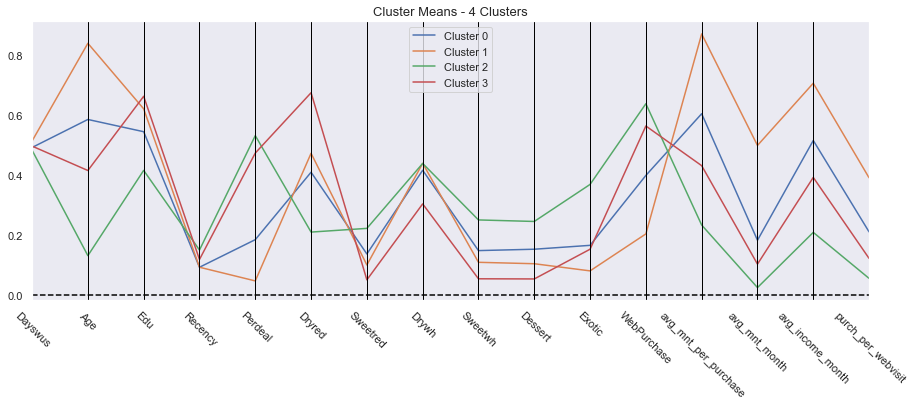

In [124]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=df_34.drop(columns=['prf_labels','cc_labels']), label_columns = ['merged_labels_34'],figsize = (15, 5))

#### 3 Clusters: test (3,3)

In [125]:
print("BD index for this solution: ",davies_bouldin_score(df_33, df_33["merged_labels_33"]))
print("Calinski-Harabasz score for this solution: ",metrics.calinski_harabasz_score(df_33, df_33["merged_labels_33"]))

BD index for this solution:  0.9312817984178068
Calinski-Harabasz score for this solution:  10162.406722486985


In [126]:
df_33.groupby('merged_labels_33')['Dayswus'].count()


merged_labels_33
0    3072
1    3971
2    2953
Name: Dayswus, dtype: int64

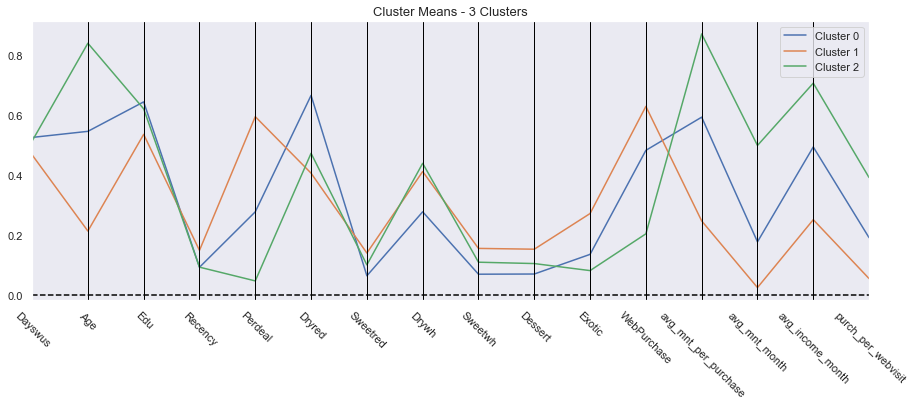

In [127]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=df_33.drop(columns=['prf_labels_33','cc_labels_33']), label_columns = ['merged_labels_33'],figsize = (15, 5))

In [128]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids_33['hclust_labels_33'].to_dict()

# Mapping the hierarchical clusters on the centroids to the observations
df_33['merged_labels_33'] = df_33.apply(lambda row: cluster_mapper[(row['prf_labels_33'], row['cc_labels_33'])], axis=1)
df_33.drop(columns=['prf_labels_33','cc_labels_33']).groupby('merged_labels_33').mean()

,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
merged_labels_33,,,,,,,,,,,,,,,,
0,0.523856,0.544141,0.642334,0.091191,0.276022,0.663969,0.062730,0.276042,0.068060,0.068690,0.134186,0.480821,0.591430,0.175944,0.492107,0.189715
1,0.465909,0.211882,0.534059,0.147465,0.593156,0.404774,0.138637,0.410276,0.154056,0.151392,0.270272,0.627301,0.245589,0.023507,0.249776,0.053457
2,0.511554,0.837730,0.619116,0.091580,0.045723,0.471064,0.099211,0.437628,0.108080,0.103542,0.080092,0.202639,0.868723,0.497162,0.704721,0.390072


In [129]:
# Caracterizing clusters formed --> using the dataset with the original scales to evaluate better
cluster_metric = pd.concat((df_final[metric_features], pd.Series(df_33['merged_labels_33'], name='Labels_M')), axis=1)
cluster_metric.groupby('Labels_M').mean()

,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit
Labels_M,,,,,,,,,,,,,,,,
0,916.698893,50.648438,17.138672,50.063802,26.774089,66.069010,4.265625,21.151042,4.219727,4.258789,12.881836,44.388997,34.631136,28.989531,6190.247995,6.260579
1,876.135986,30.712919,16.272475,80.958197,57.536137,40.667842,9.427348,30.950139,9.551498,9.386301,25.946109,56.693276,17.888975,4.159126,3552.313296,1.764077
2,908.087707,68.263800,16.952929,50.277684,4.435151,47.164240,6.746360,32.946834,6.700982,6.419573,7.688791,21.021673,48.054900,81.312743,8504.684995,12.872364


In [130]:
cluster_metric.groupby('Labels_M')['Dayswus'].count()


Labels_M
0    3072
1    3971
2    2953
Name: Dayswus, dtype: int64

In [131]:
cluster_non_metric = pd.concat((df_final[non_metric_features], pd.Series(df_33['merged_labels_33'], name='Labels_NM')), axis=1)
cluster_non_metric.groupby('Labels_NM').mean()

,Kidhome,Teenhome,Complain,Mailfriend,Emailfriend,LTV_bin,total_access,access>=100,access<100,%_spent_bin
Labels_NM,,,,,,,,,,
0,0.277344,0.801107,0.008464,0.086914,0.029622,0.862630,0.229167,0.113281,0.115885,0.024414
1,0.795014,0.393100,0.013095,0.148325,0.103752,0.330144,0.092924,0.004785,0.088139,0.000755
2,0.059939,0.228920,0.011514,0.055198,0.002709,0.998307,0.699627,0.155097,0.544531,0.428717


In [132]:
cluster_non_metric.groupby('Labels_NM')['Kidhome'].count()


Labels_NM
0    3072
1    3971
2    2953
Name: Kidhome, dtype: int64

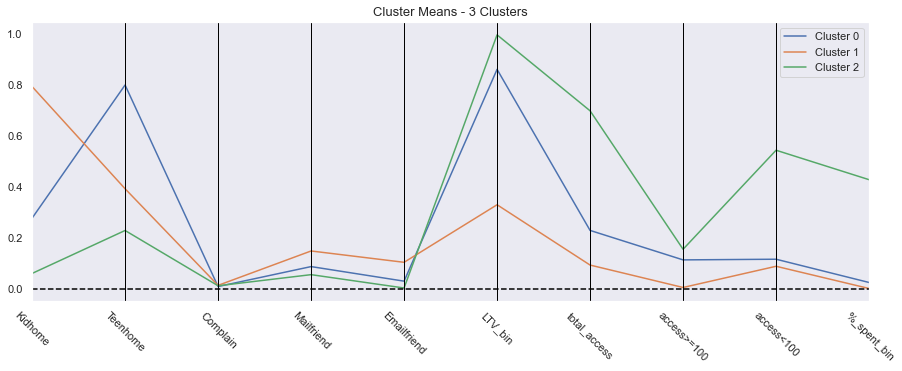

In [133]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=cluster_non_metric, label_columns = ['Labels_NM'],figsize = (15, 5))

In [134]:
cluster_metric["avg_mnt_month"].groupby(cluster_metric["Labels_M"]).mean()

Labels_M
0    28.989531
1     4.159126
2    81.312743
Name: avg_mnt_month, dtype: float64

In [135]:
cluster_metric["Labels_M"].value_counts()

1    3971
0    3072
2    2953
Name: Labels_M, dtype: int64

In [136]:
# Desenvolvimento de métrica para avaliar clusters:
    # RACIO € EM COMPRAS MENSAIS POR TAMANHO DE CADA CLUSTER (quanto maior melhor)
    
(cluster_metric["avg_mnt_month"].groupby(cluster_metric["Labels_M"]).mean())/(cluster_metric["Labels_M"].value_counts())*100

0    0.943670
1    0.104738
2    2.753564
dtype: float64

#### 2 Clusters: test (2,3)

In [137]:
print("BD index for this solution: ",davies_bouldin_score(df_23, df_23["merged_labels_23"]))
print("Calinski-Harabasz score for this solution: ",metrics.calinski_harabasz_score(df_23, df_23["merged_labels_23"]))

BD index for this solution:  1.0588470479297154
Calinski-Harabasz score for this solution:  7834.55216636951


In [138]:
df_23.groupby('merged_labels_23')['Dayswus'].count()

merged_labels_23
0    4498
1    5498
Name: Dayswus, dtype: int64

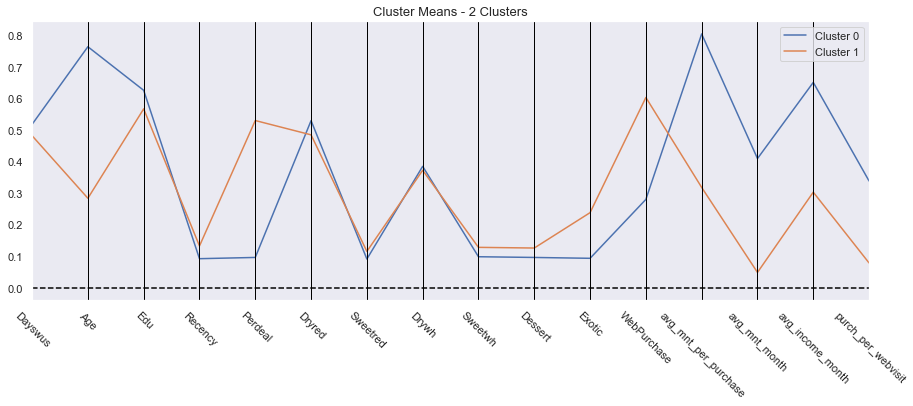

In [139]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=df_23.drop(columns=['prf_labels_23','cc_labels_23']), label_columns = ['merged_labels_23'],figsize = (15, 5))

#### 2 Clusters: test (2,4)

In [140]:
print("BD index for this solution: ",davies_bouldin_score(df_24, df_24["merged_labels_24"]))
print("Calinski-Harabasz score for this solution: ",metrics.calinski_harabasz_score(df_24, df_24["merged_labels_24"]))

BD index for this solution:  1.3323470908249058
Calinski-Harabasz score for this solution:  5025.153784347167


In [141]:
df_24.groupby('merged_labels_24')['Dayswus'].count()

merged_labels_24
0    5498
1    4498
Name: Dayswus, dtype: int64

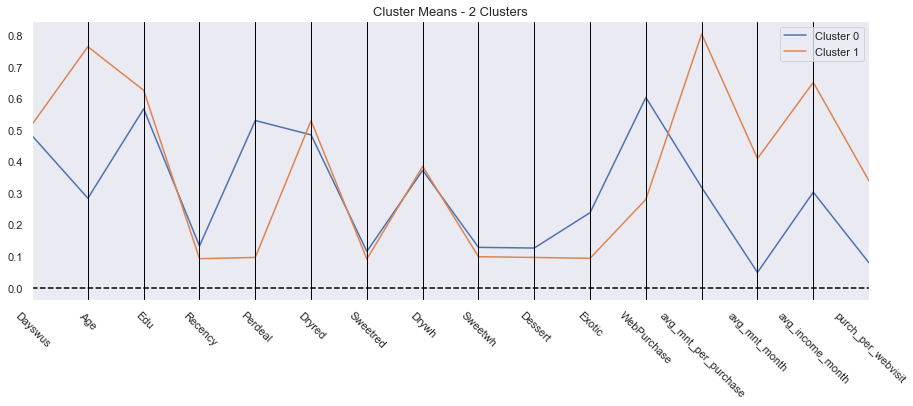

In [142]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(df=df_24.drop(columns=['prf_labels_24','cc_labels_24']), label_columns = ['merged_labels_24'],figsize = (15, 5))

### Cluster Analysis

In [143]:
from sklearn.manifold import TSNE

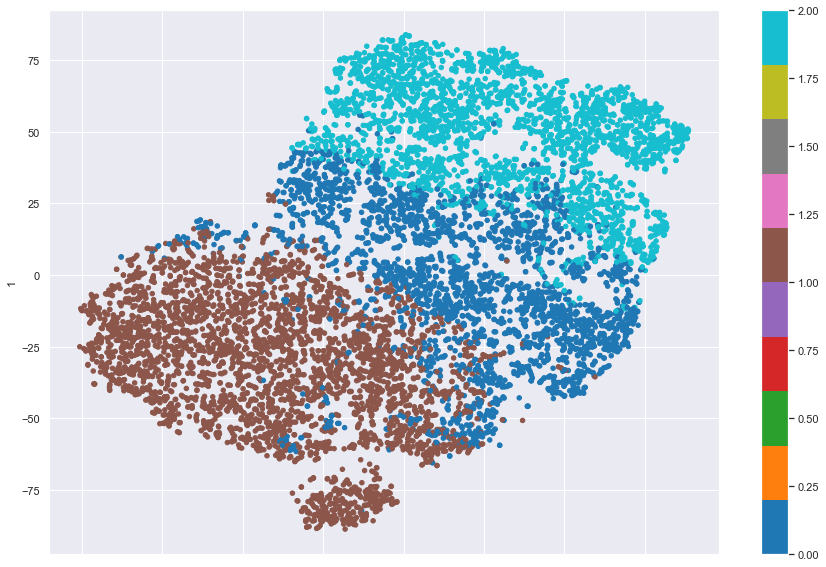

In [144]:
two_dim = TSNE(random_state=42).fit_transform(df_33.drop(columns=['merged_labels_33','cc_labels_33','prf_labels_33']))

pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df_33['merged_labels_33'], colormap='tab10', figsize=(15,10))
plt.show()

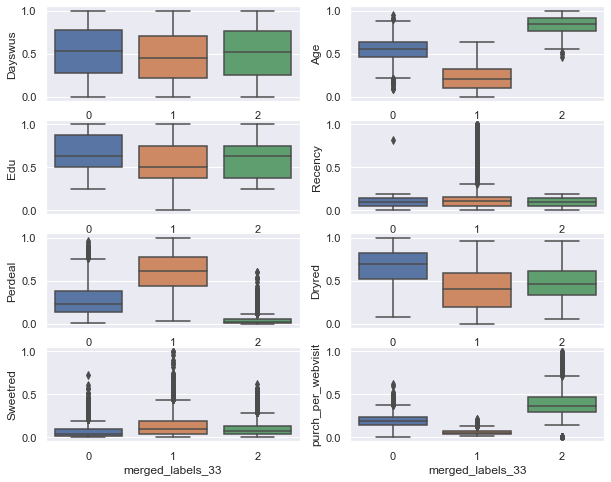

In [145]:
plt.figure(figsize=(10,8))

plt.subplot(4,2,1)
sns.boxplot(x='merged_labels_33', y='Dayswus', data=df_33)


plt.subplot(4,2,2)
sns.boxplot(x='merged_labels_33', y='Age', data=df_33)


plt.subplot(4,2,3)
sns.boxplot(x='merged_labels_33', y='Edu', data=df_33)


plt.subplot(4,2,4)
sns.boxplot(x='merged_labels_33', y='Recency', data=df_33)


plt.subplot(4,2,5)
sns.boxplot(x='merged_labels_33', y='Perdeal', data=df_33)


plt.subplot(4,2,6)
sns.boxplot(x='merged_labels_33', y='Dryred', data=df_33)


plt.subplot(4,2,7)
sns.boxplot(x='merged_labels_33', y='Sweetred', data=df_33)

plt.subplot(4,2,8)
sns.boxplot(x='merged_labels_33', y='purch_per_webvisit', data=df_33)


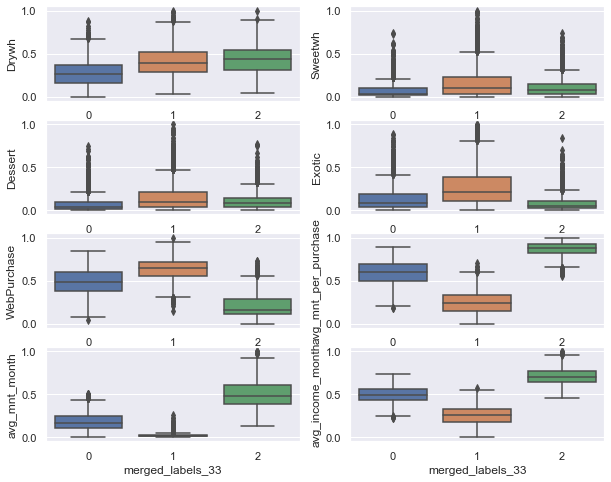

In [146]:
plt.figure(figsize=(10,8))

plt.subplot(4,2,1)
sns.boxplot(x='merged_labels_33', y='Drywh', data=df_33)


plt.subplot(4,2,2)
sns.boxplot(x='merged_labels_33', y='Sweetwh', data=df_33)


plt.subplot(4,2,3)
sns.boxplot(x='merged_labels_33', y='Dessert', data=df_33)


plt.subplot(4,2,4)
sns.boxplot(x='merged_labels_33', y='Exotic', data=df_33)


plt.subplot(4,2,5)
sns.boxplot(x='merged_labels_33', y='WebPurchase', data=df_33)


plt.subplot(4,2,6)
sns.boxplot(x='merged_labels_33', y='avg_mnt_per_purchase', data=df_33)


plt.subplot(4,2,7)
sns.boxplot(x='merged_labels_33', y='avg_mnt_month', data=df_33)

plt.subplot(4,2,8)
sns.boxplot(x='merged_labels_33', y='avg_income_month', data=df_33)


### Outliers Classification

In [147]:
outliers_df

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,total_access,access>=100,access<100,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,%_spent,LTV_bin,%_spent_bin,purch_per_webvisit
4231,7353,1248,78,20,128536.0,0,0,56.0,82.0,3052.0,...,3,1,2,54.5,169.56,10711.33,1.58,1.0,1.0,13.48
6233,5591,1226,19,13,11920.0,1,0,5.0,25.0,60.0,...,0,0,0,12.0,3.33,993.33,0.34,0.0,0.0,1.84
7019,9467,827,19,13,27911.0,1,0,5.0,38.0,47.0,...,0,0,0,9.4,2.61,2325.92,0.11,0.0,0.0,2.46
8335,5623,901,21,15,31059.0,0,0,1.0,172.0,17.0,...,0,0,0,17.0,0.94,2588.25,0.04,1.0,0.0,0.45


In [148]:
X = df_33.drop(columns={"cc_labels_33","prf_labels_33","merged_labels_33"})
y =  df_33.loc[:, 'merged_labels_33'] # Target variable

In [149]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0,stratify=y) # 70% training and 30% test

# Create Decision Tree classifer object
clf = DecisionTreeClassifier(random_state=0)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

In [150]:
# Test accuracy
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(clf.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 95.43% of the customers correctly


In [151]:
labels_out = clf.predict(outliers_df[metric_features]) # predicting to which cluster each outlier belongs
df_out=outliers_df[metric_features].copy()
df_out["cluster_label"] = labels_out
df_out.head()

,Dayswus,Age,Edu,Recency,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,avg_mnt_per_purchase,avg_mnt_month,avg_income_month,purch_per_webvisit,cluster_label
4231,1248,78,20,82.0,0.0,77.0,0.0,22.0,0.0,1.0,2.0,13.0,54.5,169.56,10711.33,13.48,2
6233,1226,19,13,25.0,63.0,3.0,75.0,5.0,6.0,11.0,71.0,53.0,12.0,3.33,993.33,1.84,2
7019,827,19,13,38.0,62.0,10.0,5.0,4.0,4.0,77.0,53.0,62.0,9.4,2.61,2325.92,2.46,2
8335,901,21,15,172.0,24.0,5.0,3.0,11.0,8.0,72.0,30.0,65.0,17.0,0.94,2588.25,0.45,2
